# **Latar Belakang**

Agen properti atau broker berperan penting dalam industri real estate. Mereka membantu pembeli dan penjual dalam transaksi jual-beli rumah, termasuk dalam penentuan harga yang sesuai. Saat ini di California terdapat banyak sekali perumahan, dimana banyak diantaranya adalah rumah yang belum terjual. Untuk membantu broker dalam penentuan harga jual yang tepat, saya diminta oleh pihak broker untuk membantu memberikan insight dan solusi terhadap permasalahan yang ada melalui dataset yang sudah dibuat oleh pihak broker.

---
# **Business Problem**

Pihak broker membutuhkan sebuah sistem / alat yang dapat membantu menentukan harga jual rumah dengan tepat. Selama ini pihak broker sering mengalami kendala dalam menentukan harga rumah, dimana kadang pihak broker menawarkan rumah dengan harga yang terlalu rendah ataupun terlalu tinggi. Hal ini berdampak negatif karena jika harga rumah terlalu rendah, pihak penjual akan dirugikan, sedangkan jika harga rumah terlalu tinggi rumah tersebut akan sulit untuk dijual. Untuk menangani permasalahan tersebut kita bisa membuat model machine learning yang dapat memprediksi harga rumah. Dengan metode ini diharapkan pihak broker bisa menentukan harga dengan lebih tepat.

---
# **Goals**

Goals dari project ini adalah mampu memberikan insight melalui analisis data dan mampu membuat model machine learning yang dapat memprediksi harga rumah berdasarkan feature-feature yang ada di dataset. Model ini diharapkan bisa membantu broker untuk menentukan harga jual rumah, dan walaupun jika model tetap melakukan underestimate atau overestimate nilainya bisa kita perkirakan

---
# **Rumusan Masalah**

- Bagaimana distribusi harga perumahan di California berdasarkan variabel-variabel yang tersedia dalam dataset?
- Apakah terdapat korelasi antara variabel-variabel di dataset dengan harga rumah?
- Dapatkah model machine learning digunakan untuk memprediksi harga rumah berdasarkan informasi yang ada dalam dataset?
- Seberapa akurat model yang telah dibuat dalam memprediksi harga rumah di California?
- Manakah variabel yang paling berpengaruh dalam memprediksi harga rumah di California?

---
# **Load Data**
Untuk menjawab rumusan masalah di atas, pertama-tama kita akan melakukan analisa data dan melakukan data cleaning jika diperlukan

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('data_california_house.csv')
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
14443,-121.26,38.27,20.0,1314.0,229.0,712.0,219.0,4.4125,INLAND,144600.0
14444,-120.89,37.48,27.0,1118.0,195.0,647.0,209.0,2.9135,INLAND,159400.0
14445,-121.90,36.58,31.0,1431.0,NaN,704.0,393.0,3.1977,NEAR OCEAN,289300.0
14446,-117.93,33.62,34.0,2125.0,498.0,1052.0,468.0,5.6315,<1H OCEAN,484600.0


Karena kita tidak mempunyai informasi detail kolom saat menerima dataset. Kita akan coba memahami informasi tiap kolom pada tahap data understanding. Ini adalah preview 5 kolom paling pertama dan 5 kolom paling akhir dari dataset.

---
# **Data Understanding**

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14448 entries, 0 to 14447
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           14448 non-null  float64
 1   latitude            14448 non-null  float64
 2   housing_median_age  14448 non-null  float64
 3   total_rooms         14448 non-null  float64
 4   total_bedrooms      14311 non-null  float64
 5   population          14448 non-null  float64
 6   households          14448 non-null  float64
 7   median_income       14448 non-null  float64
 8   ocean_proximity     14448 non-null  object 
 9   median_house_value  14448 non-null  float64
dtypes: float64(9), object(1)
memory usage: 1.1+ MB


Semua format data sudah sesuai dengan infromasi terkait kolomnya

In [4]:
display(df.describe(), df.describe(include= 'object'))

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14448.000000,14448.000000,14448.000000,14448.000000,14311.000000,14448.000000,14448.000000,14448.000000,14448.000000
mean,-119.566647,35.630093,28.618702,2640.132683,538.260709,1425.157323,499.508929,3.866667,206824.624516
std,2.006587,2.140121,12.596694,2191.612441,423.577544,1149.580157,383.098390,1.891158,115365.476182
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1451.000000,295.000000,784.000000,279.000000,2.570600,119600.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1165.000000,410.000000,3.539100,180000.000000
75%,-118.000000,37.710000,37.000000,3148.000000,647.000000,1724.000000,604.000000,4.736100,263900.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


,ocean_proximity
count,14448
unique,5
top,<1H OCEAN
freq,6369


Dari informasi di atas kita bisa melihat bahwa nilai dari median_house_value tidak merepresentasikan 1 unit rumah, melainkan nilai median dari beberapa rumah di daerah tertentu. Begitu juga dengan kolom-kolom yang lain.

Berdasarkan informasi di atas berikut adalah penjelasan dari tiap kolom :

| Kolom | Deskripsi Kolom |
|--- | --- |
| longitude | Koordinat garis bujur |
| latitude | Koordinat garis lintang |
| Housing median age | Median dari kumpulan rumah |
| total_rooms | Total kamar dari tiap kumpulan rumah | 
| total_bedrooms | Total kamar tidur dari kumpulan rumah |
| population | Populasi pada daerah dimana kumpulan rumah itu berada |
| households | Jumlah keluarga pada daerah tersebut |
| median_income | Median pendapatan pada daerah tersebut |
| median house value | Median harga rumah pada daerah tersebut |
| ocean_proximity | Lokasi rumah berdasarkan jaraknya dengan laut |

In [5]:
df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        137
population              0
households              0
median_income           0
ocean_proximity         0
median_house_value      0
dtype: int64

Terdapat 137 missing value pada kolom total_bedrooms

In [6]:
df.duplicated().sum()

0

Tidak terdapat data yang duplikat pada dataset.

In [7]:
pd.set_option('display.max_colwidth', None)
# data unik di tiap kolom
listItem = []
for col in df.columns :
    listItem.append([col, df[col].nunique(), df[col].isna().sum(), (df[col].isna().sum() / len(df) * 100).round(2), df[col].unique()])

df_desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Number of Missing Value', 'Number of Missing Value (%)', 'Unique Sample'],
                     data=listItem)
df_desc

,Column Name,Number of Unique,Number of Missing Value,Number of Missing Value (%),Unique Sample
0,longitude,806,0,0.00,"[-119.79, -122.21, -118.04, -118.28, -119.81, -117.79, -117.8, -121.26, -117.65, -122.27, -121.94, -121.9, -118.15, -117.5, -121.33, -115.99, -117.09, -118.14, -120.9, -121.51, -117.32, -117.34, -121.53, -118.27, -120.84, -120.38, -118.2, -121.52, -121.09, -117.54, -119.29, -119.83, -118.12, -118.31, -118.24, -117.62, -121.95, -117.88, -117.68, -121.92, -118.85, -122.41, -117.59, -121.86, -118.02, -122.43, -122.26, -117.02, -118.26, -121.36, -119.9, -121.85, -120.85, -118.21, -121.65, -119.74, -122.03, -117.69, -122.04, -122.25, -118.43, -121.91, -124.0, -117.82, -123.98, -121.99, -120.6, -118.22, -122.05, -121.64, -117.75, -117.25, -118.29, -122.7, -121.49, -122.28, -122.02, -121.47, -117.72, -117.31, -121.38, -117.17, -119.12, -121.2, -117.22, -122.47, -118.36, -124.16, -122.42, -117.92, -124.13, -122.24, -121.8, -117.93, -120.46, -116.86, -117.28, -120.99, -117.89, -118.39, ...]"
1,latitude,836,0,0.00,"[36.73, 37.77, 33.87, 34.06, 33.8, 33.81, 38.69, 33.48, 37.97, 37.28, 37.44, 34.05, 33.96, 38.64, 33.4, 32.68, 34.7, 38.2, 38.5, 34.14, 34.13, 38.61, 34.08, 38.77, 36.76, 33.93, 38.57, 38.68, 33.82, 37.98, 36.53, 36.8, 34.09, 33.67, 34.11, 38.31, 33.77, 35.63, 37.3, 34.21, 37.37, 37.6, 33.91, 37.32, 33.65, 37.71, 33.97, 37.88, 32.7, 33.94, 34.19, 38.67, 36.94, 38.0, 37.06, 36.71, 39.13, 34.44, 37.39, 37.36, 37.84, 34.22, 34.02, 33.71, 37.29, 40.22, 33.68, 40.88, 37.26, 33.95, 37.93, 36.68, 33.21, 34.17, 38.36, 38.58, 36.97, 37.9, 37.53, 33.51, 34.35, 32.77, 35.39, 33.84, 39.25, 34.26, 37.51, 35.6, 34.07, 40.79, 38.27, 33.63, 40.8, 37.59, 37.75, 34.03, 33.72, 38.09, 33.64, 33.05, ...]"
2,housing_median_age,52,0,0.00,"[52.0, 43.0, 17.0, 50.0, 11.0, 14.0, 6.0, 10.0, 18.0, 4.0, 31.0, 12.0, 27.0, 15.0, 20.0, 16.0, 25.0, 32.0, 29.0, 5.0, 38.0, 41.0, 9.0, 33.0, 24.0, 42.0, 44.0, 21.0, 35.0, 34.0, 7.0, 13.0, 22.0, 49.0, 26.0, 40.0, 3.0, 30.0, 39.0, 23.0, 46.0, 51.0, 47.0, 48.0, 28.0, 19.0, 37.0, 36.0, 2.0, 8.0, 45.0, 1.0]"
3,total_rooms,5227,0,0.00,"[112.0, 1017.0, 2358.0, 2518.0, 772.0, 10535.0, 1206.0, 3917.0, 1638.0, 15259.0, 4356.0, 1646.0, 3362.0, 7923.0, 2203.0, 1945.0, 2569.0, 1984.0, 3120.0, 4719.0, 1691.0, 331.0, 8149.0, 2265.0, 1013.0, 932.0, 857.0, 2360.0, 5218.0, 202.0, 2370.0, 1509.0, 3756.0, 3603.0, 1297.0, 2141.0, 3030.0, 1911.0, 777.0, 1519.0, 4334.0, 1335.0, 2195.0, 1476.0, 4424.0, 10223.0, 2519.0, 2548.0, 1508.0, 1903.0, 2363.0, 2756.0, 1510.0, 1678.0, 5819.0, 2513.0, 3364.0, 2609.0, 1026.0, 2574.0, 4833.0, 4257.0, 3280.0, 3240.0, 3298.0, 3549.0, 1588.0, 561.0, 4014.0, 3597.0, 2088.0, 7105.0, 1719.0, 4034.0, 2521.0, 1823.0, 7803.0, 6568.0, 1293.0, 1944.0, 1732.0, 5817.0, 2151.0, 2695.0, 2261.0, 564.0, 4280.0, 1072.0, 3617.0, 2404.0, 2943.0, 3856.0, 1264.0, 3301.0, 906.0, 2398.0, 8020.0, 4974.0, 3643.0, 2382.0, ...]"
4,total_bedrooms,1748,137,0.95,"[28.0, 328.0, 396.0, 1196.0, 194.0, 1620.0, 142.0, 638.0, 188.0, 2275.0, 1334.0, 408.0, 799.0, 1470.0, 493.0, 536.0, 737.0, 614.0, 641.0, 745.0, 353.0, 85.0, 1913.0, 801.0, 244.0, 201.0, 471.0, 711.0, 29.0, 424.0, 352.0, 681.0, 1003.0, 246.0, 451.0, 589.0, 439.0, 148.0, 388.0, 296.0, 414.0, 217.0, 834.0, 1491.0, 581.0, 646.0, 278.0, 469.0, 604.0, 516.0, 410.0, 277.0, 1507.0, 570.0, 645.0, 221.0, 807.0, 944.0, 1031.0, 933.0, 481.0, 460.0, 707.0, 360.0, 284.0, 868.0, 664.0, 535.0, 1459.0, 372.0, 611.0, 484.0, 358.0, 477.0, 1603.0, 339.0, 488.0, 305.0, 878.0, 96.0, 673.0, nan, 597.0, 390.0, 554.0, 875.0, 202.0, 712.0, 144.0, 448.0, 1432.0, 764.0, 706.0, 404.0, 241.0, 279.0, 732.0, 566.0, 226.0, 462.0, ...]"
5,population,3498,0,0.00,"[193.0, 836.0, 1387.0, 3051.0, 606.0, 4409.0, 572.0, 1809.0, 7266.0, 1968.0, 853.0, 1939.0, 4861.0, 1158.0, 515.0, 2341.0, 1071.0, 1319.0, 1857.0, 1457.0, 341.0, 2933.0, 2899.0, 410.0, 1043.0, 934.0, 1041.0, 1949.0, 75.0, 1129.0, 1734.0, 1586.0, 2719.0, 611.0, 1777.0, 1373.0, 930.0, 362.0, 1203.0, 635.0, 1360.0, 613.0, 1915.0, 52

Tidak terlihat ada data yang janggal, namun pada kolom total_bedrooms terdapat missing value sebanyak 137 data. Jumlah missing value adalah 0.95% dari dataset

---
# **Data Cleaning**

Karena jumlah missing value hanya sebesar 0.95% dari dataset, kita dapat menghapus data yang memiliki missing value. Metode ini seharusnya tidak akan mempengaruhi hasil analisa ataupun performa model yang akan kita buat nanti. Terlebih lagi kita tetap menjaga originalitas informasi pada dataset.

In [8]:
df.shape

(14448, 10)

In [9]:
df = df.dropna()
df.shape

(14311, 10)

In [10]:
df.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
median_house_value    0
dtype: int64

Sekarang sudah tidak terdapat missing value pada dataset. Dataset awal yang tadinya berjumlah 14448 baris sekarang berkurang menjadi 14311 baris.

---
# **Explanatory Data Analysis (EDA)**

---
## Distribusi Data

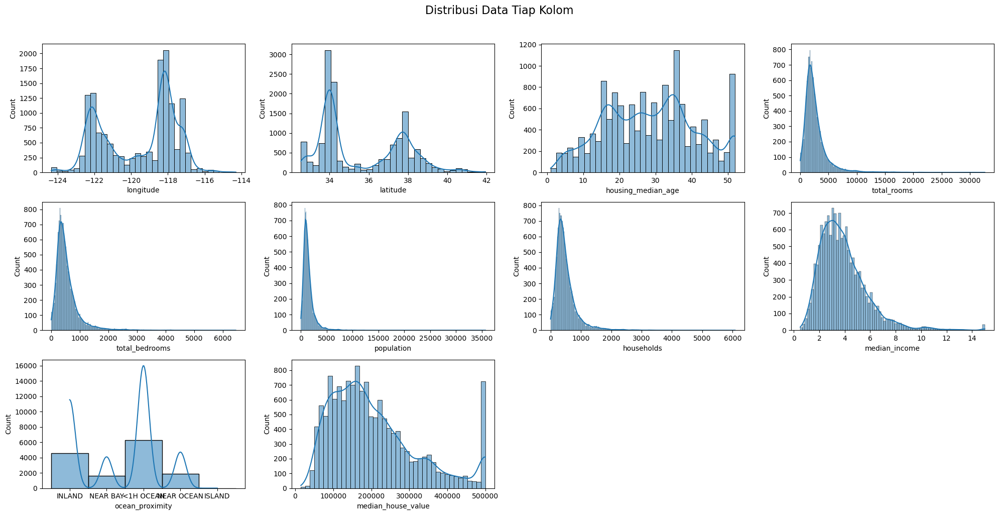

In [11]:
plt.figure(figsize= (20, 10))
plt.suptitle('Distribusi Data Tiap Kolom', fontsize= 16, y= 1.02)

for i,col in enumerate(df.columns, start= 1):
    ax= plt.subplot(3, 4, i)
    sns.histplot(df[col], kde= True, ax= ax)

plt.tight_layout()
plt.show()

Insight:
- Persebaran data untuk setiap kolom tidak normal
- Kolom longtitude dan latitude memiliki 2 puncak, dimana untuk longtitude koordinat puncaknya adalah di sekiatar -122 dan -118, sementara untuk latitude di sekitar koordinat 34 dan 38. 
- Pada kolom median_house_value terdapat outlier di harga 500000

Sekarang mari kita coba lihat outlier dengan boxplot

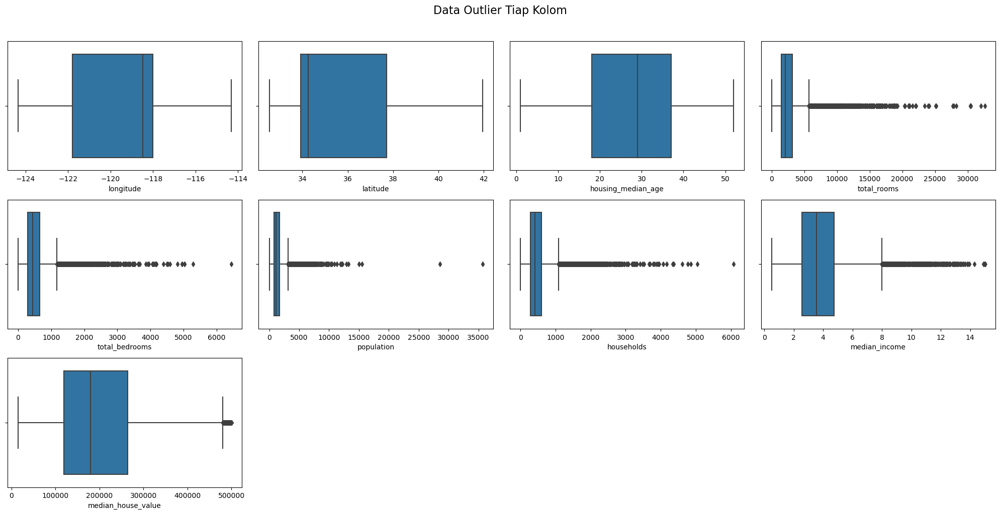

In [12]:
plt.figure(figsize= (20, 10))
plt.suptitle('Data Outlier Tiap Kolom', fontsize= 16, y= 1.02)

for i,col in enumerate(df.describe().columns, start= 1):
    ax= plt.subplot(3, 4, i)
    sns.boxplot(data= df, x= col, ax= ax)

plt.tight_layout()
outlier_plot = plt.gcf()

plt.show()

In [13]:
list_iqr = []
list_lower = [] 
list_upper = []
list_min = []
list_max = []
list_lower_outlier = []
list_upper_outlier = []
list_pct_lower_outlier = []
list_pct_upper_outlier = []

for col in df.describe().columns[3:]:
    iqr_value = df[col].quantile(0.75) - df[col].quantile(0.25)
    lower_whisker = df[col].describe()['25%'] - 1.5 * iqr_value
    upper_whisker = df[col].describe()['75%'] + 1.5 * iqr_value

    if lower_whisker < 0:
        lower_whisker = 0
    
    list_iqr.append(iqr_value)
    list_lower.append(lower_whisker)
    list_upper.append(upper_whisker)

    min_data_range = df[col].min()
    max_data_range = df[col].max()

    list_min.append(min_data_range)
    list_max.append(max_data_range)

    lower_outlier = df[df[col] <= lower_whisker].count()[col]
    upper_outlier = df[df[col] >= upper_whisker].count()[col]

    list_lower_outlier.append(lower_outlier)
    list_upper_outlier.append(upper_outlier)

    pct_lower_outlier = ((lower_outlier / len(df)).round(2)) * 100
    pct_upper_outlier = ((upper_outlier / len(df)).round(2)) * 100

    list_pct_lower_outlier.append(pct_lower_outlier)
    list_pct_upper_outlier.append(pct_upper_outlier)

In [14]:
df_outlier = pd.DataFrame()
df_outlier['column'] = df.describe().columns[3:]
df_outlier['iqr'] = list_iqr
df_outlier['lower_whisker'] = list_lower
df_outlier['min_data_range'] = list_min
df_outlier['upper_whisker'] = list_upper
df_outlier['max_data_range'] = list_max
df_outlier['n_lower_outlier'] = list_lower_outlier
df_outlier['n_upper_outlier'] = list_upper_outlier
df_outlier['%_lower_outlier'] = list_pct_lower_outlier
df_outlier['%_upper_outlier'] = list_pct_upper_outlier

df_outlier

,column,iqr,lower_whisker,min_data_range,upper_whisker,max_data_range,n_lower_outlier,n_upper_outlier,%_lower_outlier,%_upper_outlier
0,total_rooms,1690.0000,0,2.0000,5677.00000,32627.0000,0,906,0.0,6.0
1,total_bedrooms,352.0000,0,1.0000,1175.00000,6445.0000,0,880,0.0,6.0
2,population,938.0000,0,3.0000,3129.00000,35682.0000,0,823,0.0,6.0
3,households,324.5000,0,1.0000,1090.25000,6082.0000,0,836,0.0,6.0
4,median_income,2.1667,0,0.4999,7.98615,15.0001,0,477,0.0,3.0
5,median_house_value,144350.0000,0,14999.0000,480275.00000,500001.0000,0,751,0.0,5.0


In [15]:
print(f"Total data outlier sebanyak {sum(df_outlier['n_upper_outlier'])} atau {sum(df_outlier['%_upper_outlier'])}% dari dataset")

Total data outlier sebanyak 4673 atau 32.0% dari dataset


---
## **Korelasi**

Karena persebaran data tidak normal, kita akan memakai metode spearman untuk melihat korelasi dari dataset.

In [16]:
df.corr(method= 'spearman')

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.879079,-0.160510,0.054567,0.075678,0.135749,0.071248,-0.006631,-0.069630
latitude,-0.879079,1.000000,0.042375,-0.034629,-0.069869,-0.137716,-0.088238,-0.092715,-0.167932
housing_median_age,-0.160510,0.042375,1.000000,-0.362415,-0.314208,-0.287518,-0.288576,-0.147867,0.071923
total_rooms,0.054567,-0.034629,-0.362415,1.000000,0.916249,0.815262,0.907008,0.270188,0.198396
total_bedrooms,0.075678,-0.069869,-0.314208,0.916249,1.000000,0.870014,0.975877,-0.002529,0.081704
population,0.135749,-0.137716,-0.287518,0.815262,0.870014,1.000000,0.902313,0.004641,-0.002221
households,0.071248,-0.088238,-0.288576,0.907008,0.975877,0.902313,1.000000,0.031464,0.107417
median_income,-0.006631,-0.092715,-0.147867,0.270188,-0.002529,0.004641,0.031464,1.000000,0.680674
median_house_value,-0.069630,-0.167932,0.071923,0.198396,0.081704,-0.002221,0.107417,0.680674,1.000000


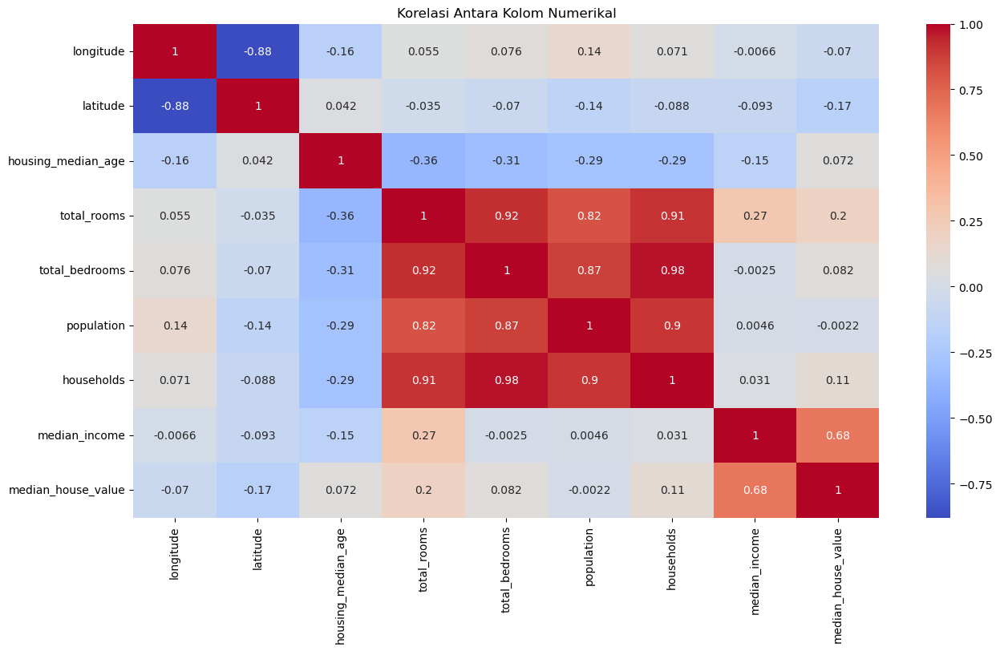

In [17]:
plt.figure(figsize= (15, 8))
sns.heatmap(data= df.corr(method= 'spearman'), annot= True, cmap= 'coolwarm')
plt.title('Korelasi Antara Kolom Numerikal')

plt.show()

Insight:
- Kolom populasi memiliki korelasi positif yang kuat dengan total_rooms, total_bedrooms, dan households. Hal ini masuk akal karena jika pada suatu daerah populasinya tinggi pasti fasilitas tempat tinggalnya juga akan semakin banyak
- Kolom median_house_value memiliki korelasi positif dengan tingkat medium dengan median_income
- Kolom housing_median_age memiliki korelasi negatif dengan tingkat lemah terhadap total_rooms

Untuk mendapatkan gambaran yang lebih baik kita akan lebih fokus melakukan analisa terhadap feature-feature yang memiliki level korelasi medium ke atas.

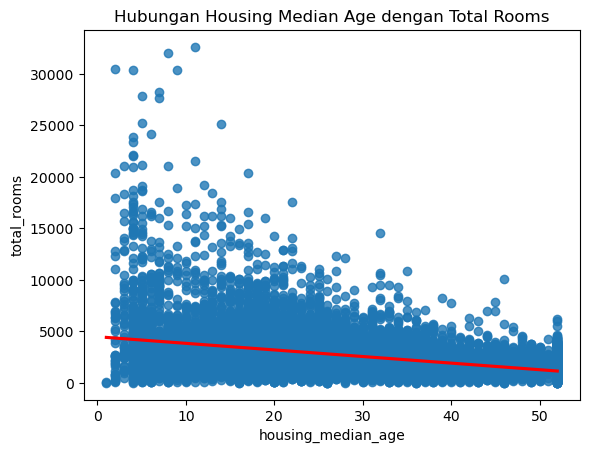

In [18]:
sns.regplot(data= df, x= 'housing_median_age', y= 'total_rooms', line_kws= {'color': 'red'})
plt.title('Hubungan Housing Median Age dengan Total Rooms')
plt.show()

Rumah dengan umur yang lebih muda biasanya memiliki jumlah kamar yang lebih banyak

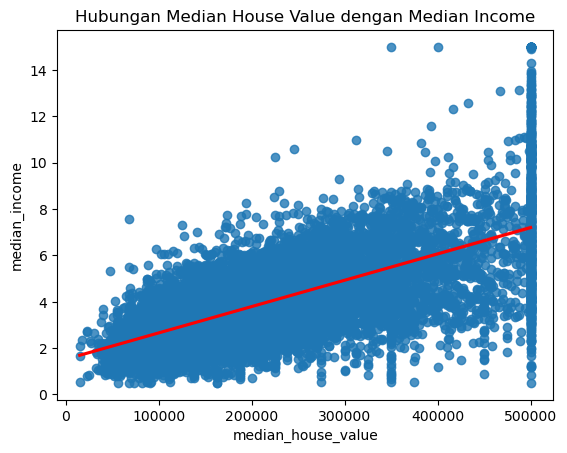

In [19]:
sns.regplot(data= df, x= 'median_house_value', y= 'median_income', line_kws= {'color': 'red'})
plt.title('Hubungan Median House Value dengan Median Income')
plt.show()

Terdapat kecenderungan dimana harga rumah meningkat seiring dengan meningkatnya pendapatan pada suatu daerah.

---
## **Lokasi**

In [20]:
import plotly.express as px

### Lokasi Rumah Berdasarkan Populasi

In [21]:
import plotly.express as px

fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_data=["median_income"],
                        color="population", zoom=4, height=500)

fig.update_traces(marker=dict(size=10))

fig.update_layout(mapbox_style="open-street-map",  title= 'Persebaran Populasi')
fig.show()

Populasi tersebar merata, namun ada 1 lokasi dengan koordinat (longitude= 117.42, latitude= 33.35) yang memiliki populasi yang sangat tinggi. Lokasi tersebut adalah base marine corps.

### Lokasi Rumah Berdasarkan Umur

In [22]:
import plotly.express as px

fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_data=["median_income"],
                        color="housing_median_age", zoom=4, height=500)

fig.update_traces(marker=dict(size=10))

fig.update_layout(mapbox_style="open-street-map", title= 'Persebaran Rumah Berdasarkan Umur')
fig.show()

Rumah yang tua lokasinya banyak terdapat di ocean proximity dekat dengan laut. 

### Lokasi Rumah Berdasarkan Ocean Proximity

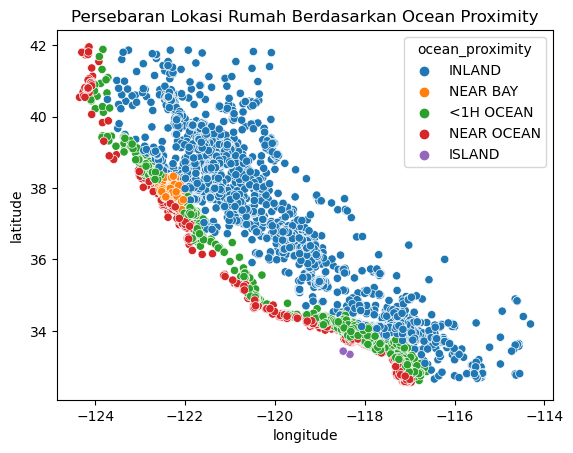

In [23]:
sns.scatterplot(data= df, x= 'longitude', y= 'latitude', hue= 'ocean_proximity')
plt.title('Persebaran Lokasi Rumah Berdasarkan Ocean Proximity')

plt.show()

Gambaran persebaran rumah berdasarkan ocean_proximity

### Lokasi Rumah Berdasarkan Median Income

In [24]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_data=["median_income", "ocean_proximity"],
                        color="median_income", zoom=4, height=500)

fig.update_traces(marker=dict(size=10))

fig.update_layout(mapbox_style="open-street-map", title= 'Persebaran Lokasi Median Income')

fig.show()

Berdasarkan plot di atas kita bisa melihat bahwa median_income yang tinggi terdapat di lokasi dekat dengan laut. 

### Lokasi Rumah Berdasarkan Median House Value

In [25]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_data=["median_income", "ocean_proximity"],
                        color="median_house_value", zoom=4, height=500)

fig.update_traces(marker=dict(size=15))

fig.update_layout(mapbox_style="open-street-map", title= 'Persebaran Lokasi Median House Value')
fig.show()

Mayoritas rumah yang memiliki harga tinggi terdapat pada kota-kota besar, dengan ocean proximity dekat dengan laut. 

---
## Hubungan Harga Rumah Dengan Pendapatan

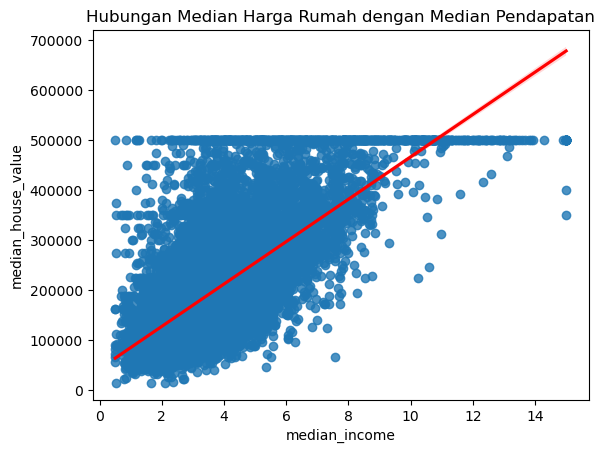

In [26]:
plt.title('Hubungan Median Harga Rumah dengan Median Pendapatan')
sns.regplot(data= df, x= 'median_income', y= 'median_house_value', line_kws= {'color': 'red'})

plt.show()

Terdapat kecenderungan dimana semakin tinggi median_income pada suatu daerah maka harga median_house_value juga semakin tinggi

---
## Hubungan harga rumah dengan ocean_proximity

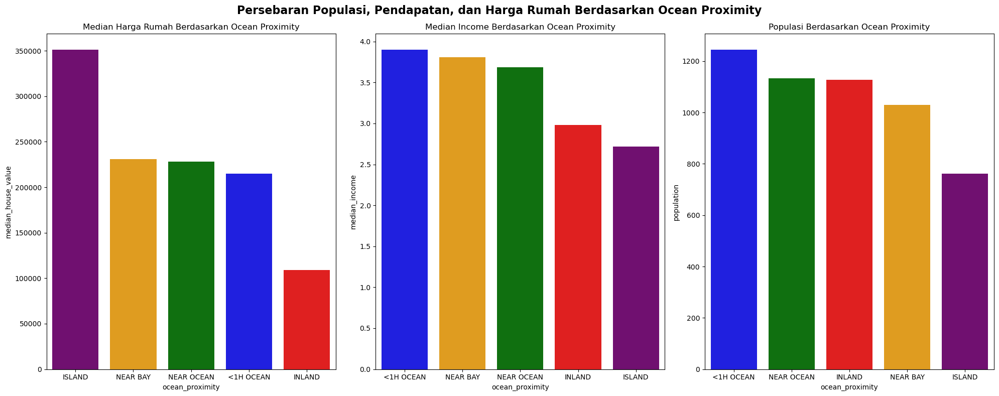

In [27]:
plt.figure(figsize= (20, 8))
plt.suptitle('Persebaran Populasi, Pendapatan, dan Harga Rumah Berdasarkan Ocean Proximity', fontsize= 16, fontweight= 'bold')

color_map = {'<1H OCEAN': 'blue', 'INLAND': 'red', 'NEAR OCEAN': 'green', 'NEAR BAY': 'orange', 'ISLAND': 'purple'}

ax = plt.subplot(1, 3, 1)
sns.barplot(data= df, x= 'ocean_proximity', y= 'median_house_value', ci= False, estimator= np.median,
            order= df.groupby('ocean_proximity')['median_house_value'].median().sort_values(ascending=False).index,
            palette= color_map
            )
ax.set_title('Median Harga Rumah Berdasarkan Ocean Proximity')

ax = plt.subplot(1, 3, 2)
sns.barplot(data= df, x= 'ocean_proximity', y= 'median_income', ci= False, estimator= np.median,
            order= df.groupby('ocean_proximity')['median_income'].median().sort_values(ascending=False).index,
            palette= color_map
            )
ax.set_title('Median Income Berdasarkan Ocean Proximity')

ax = plt.subplot(1, 3, 3)
sns.barplot(data= df, x= 'ocean_proximity', y= 'population', ci= False, estimator= np.median,
            order= df.groupby('ocean_proximity')['population'].median().sort_values(ascending=False).index,
            palette= color_map
            )
ax.set_title('Populasi Berdasarkan Ocean Proximity')

plt.tight_layout()
plt.show()

- Median harga rumah tertinggi terjadi pada rumah-rumah yang memiliki ocean_proximity "island", sedangkan median harga rumah terendah terjadi pada rumah-rumah dengan ocean_proximity "inland".
- Salah satu faktor yang mungkin memengaruhi perbedaan tersebut adalah tingkat median_income. Terdapat kecenderungan bahwa median_income cenderung meningkat jika rumah tersebut berada lebih dekat dengan laut.
- Selain itu, dapat dilihat bahwa populasi di daerah-daerah yang dekat dengan laut juga cenderung tinggi. Hal ini bisa menjadi indikasi bahwa daerah-daerah tersebut lebih diminati dan memiliki daya tarik yang lebih tinggi bagi penduduk.

---
# **Data Preprocessing**

Sekarang kita akan memproses dataset agar data bisa digunakan untuk modeling. Hal yang akan dilakukan adalah:
- Mengklasifikasikan dataset ke dalam 2 variabel. Variabel 'X' untuk menyimpan feature dari dataset dan variabel 'y' untuk menyimpan target yang akan kita prediksi nanti 
- Melakukan splitting data menjadi train-set dan test-set 
- Melakukan encoding terhadap kolom ocean_proximity, karena untuk modeling semua data harus berupa numerik
- Melakukan scaling terhadap feature numerikal. Karena range data tiap kolom berbeda kita harus melakukan scaling, jika kita tidak melakukan scaling ada kemungkinan feature dengan range yang besar akan lebih mempengaruhi model, padahal mungkin feature tersebut tidak penting

Kita akan mencoba 2 skenario. Skenario pertama adalah kita lakukan modeling terhadap data yang outliernya kita biarkan, dan skenario ke 2 kita akan mencoba mengurangi jumlah outlier pada dataset. Hasilnya nanti akan kita evaluasi dan bandingkan.

---
## Define X & y

Kita akan mengklasifikasikan data menjadi 2, yaitu kolom-kolom yang merupakan feature (X) dan kolom target (y)

In [28]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
14442,-120.06,36.94,19.0,901.0,183.0,700.0,190.0,2.2375,INLAND,64300.0
14443,-121.26,38.27,20.0,1314.0,229.0,712.0,219.0,4.4125,INLAND,144600.0
14444,-120.89,37.48,27.0,1118.0,195.0,647.0,209.0,2.9135,INLAND,159400.0
14446,-117.93,33.62,34.0,2125.0,498.0,1052.0,468.0,5.6315,<1H OCEAN,484600.0


In [29]:
X = df.drop(columns= 'median_house_value')
y = df['median_house_value']

display(X, y)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND
...,...,...,...,...,...,...,...,...,...
14442,-120.06,36.94,19.0,901.0,183.0,700.0,190.0,2.2375,INLAND
14443,-121.26,38.27,20.0,1314.0,229.0,712.0,219.0,4.4125,INLAND
14444,-120.89,37.48,27.0,1118.0,195.0,647.0,209.0,2.9135,INLAND
14446,-117.93,33.62,34.0,2125.0,498.0,1052.0,468.0,5.6315,<1H OCEAN


0         47500.0
1        100000.0
2        285800.0
3        175000.0
4         59200.0
           ...   
14442     64300.0
14443    144600.0
14444    159400.0
14446    484600.0
14447     69400.0
Name: median_house_value, Length: 14311, dtype: float64

Sekarang dataset kita sudah tersimpan ke dalam 2 variabel. Variabel X menyimpan feature dari dataset, dan variabel y menyimpan target yang akan kita prediksi nanti.

---
## Data Splitting

Kita akan membagi data menjadi train-set dan test-set. Data train-set akan kita gunakan sebagai bahan belajar model machine learning kita, lalu nanti model tersebut akan ditest performanya ke test-set.

In [30]:
from sklearn.model_selection import train_test_split

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)

---
# **Modeling**

Pada tahap ini kita akan melakukan data transformation (scaling & encoding) dan cross validation terhadap train-set untuk menentukan benchmark model. Benchmark model tersebut nanti kita akan tuning dengan tujuan meningkatkan performa dari model tersebut. Setelah menentukan benchmark model kita akan melakukan hyperparameter tuning pada model tersebut.

Kita akan menggunakan beberapa metrics untuk mengevaluasi model kita:
- R2 (R-Squared)
    - R2 hanya bisa digunakan pada model regresi linear. Metric ini mengukur seberapa baik model dalam menangkap pola dari target untuk melakukan prediksi
    - R2 memiliki rentang nilai antara 0 - 1. Semakin mendekati 1 artinya model semakin baik dalam membaca pola dan memprediksi target 
- RMSE (Root Mean Squared Error)
    - Metric ini mengukur tingkat kesalahan prediksi dengan cara menghitung akar dari rata-rata kuadrat selisih antara nilai prediksi dengan nilai sebenarnya. Metric ini lebih sensitif terhadap outlier karena dalam formulanya terdapat kuadrat. Hal ini menyebabkan semakin tinggi outlier maka outlier itu akan semakin mempengaruhi masil metric 
- MAE (Mean Absolute Error)
    - Metric ini mirip dengan RMSE, perbedaan terbesarnya adalah MAE nilainya di-absolutkan, sedangkan RMSE menggunakan akar dari rata-rata kuadrat. Metric ini lebih tidak sensitif terhadap outlier dibandingkan RMSE. Hal ini disebabkan karena pada formulanya nilai di-absolutkan sedangkan pada RMSE nilai dikuadratkan
- MAPE (Mean Absolute Percentage Error)
    - Meric ini mengukur rata-rata persentase kesalahan error antara nilai prediksi dan nilai sebenarnya. Metric ini biasa digunakan untuk interpretasi hasil dari model, karena output dari metric ini berupa persentase error dari model

Nilai RMSE, MAE, MAPE semakin kecil semakin baik, karena semakin kecil nilai metric ini menandakan eror dari model semakin kecil. Kita juga akan mengevaluasi nilai mean dan std dari setiap metric untuk mengevaluasi performa model. Mean memberikan gambaran tentang nilai rata-rata kesalahan prediksi yang dihasilkan oleh model, sementara std mengindikasikan sejauh mana nilai kesalahan prediksi tersebar dari nilai mean.

Dengan melihat nilai mean dan std, kita dapat mendapatkan informasi tentang seberapa konsisten dan akurat model dalam melakukan prediksi. Semakin kecil nilai mean dan std, semakin baik model dalam melakukan prediksi yang konsisten dan akurat.

---
## Define Data Transformation Method

Sekarang kita akan melakukan encoding untuk data yang masih bertipe kategorikal (ocean_proximity) dan scaling untuk data numerikal.

In [32]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

In [33]:
X.describe().columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income'],
      dtype='object')

In [34]:
transformer = ColumnTransformer([
    ('encoding', OneHotEncoder(), ['ocean_proximity']),
    ('scaling', StandardScaler(), X.describe().columns) 
], remainder= 'passthrough')

Untuk encoding kita memilih untuk memakai metode onehot karena nilai unik dari kolom ocean_proximity sedikit, hanya 4. Untuk scaling kita akan memakai standardscaler, kita akan mencoba metode scaling yang lain saat hyperparameter tuning.

--- 
## Cross Validation

In [35]:
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost.sklearn import XGBRegressor

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import cross_val_score

Define algorithm

In [36]:
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state= 0)
rf = RandomForestRegressor(random_state= 0)
adb = AdaBoostRegressor(random_state= 0)
gb = GradientBoostingRegressor(random_state= 0)
xgb = XGBRegressor(random_state= 0)

In [37]:
list_all_model = [lr, knn, dt, rf, adb, gb, xgb]
list_all_metrics = ['r2', 'neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error']

list_model = []
list_metrics = []
list_score = []

list_mean_r2 = []
list_std_r2 = []

list_mean_rmse = []
list_std_rmse = []

list_mean_mae = []
list_std_mae = []

list_mean_mape = []
list_std_mape = []

for model in list_all_model:
    for metric in list_all_metrics:
        cv_model = Pipeline([
            ('preprocessing', transformer),
            ('model', model)
        ])

        cv_score = cross_val_score(
            estimator= cv_model,
            X= X_train,
            y= y_train,
            cv= 5,
            scoring= metric,
            error_score= 'raise'
        )

        if metric == 'r2':
            list_score.append(cv_score)
            list_mean_r2.append(cv_score.mean())
            list_std_r2.append(cv_score.std())
        elif metric == 'neg_root_mean_squared_error':
            list_score.append(cv_score)
            list_mean_rmse.append(cv_score.mean())
            list_std_rmse.append(cv_score.std())
        elif metric == 'neg_mean_absolute_error':
            list_score.append(cv_score)
            list_mean_mae.append(cv_score.mean())
            list_std_mae.append(cv_score.std())
        else:
            list_score.append(cv_score)
            list_mean_mape.append(cv_score.mean())
            list_std_mape.append(cv_score.std())

In [38]:
df_cv = pd.DataFrame({
    'Model': ['LinearRegression', 'KNeighborsRegressor', 'DecisionTreeRegressor', 'RandomForestRegressor', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor'],
    'Mean_r2': list_mean_r2,
    'Std_r2': list_std_r2,
    'Mean_RMSE': list_mean_rmse,
    'Std_RMSE': list_std_rmse,
    'Mean_MAE': list_mean_mae,
    'Std_MAE': list_std_mae,
    'Mean_MAPE': list_mean_mape,
    'Std_MAPE': list_std_mape,
})

df_cv = df_cv.sort_values('Mean_RMSE', ascending= False)
df_cv

,Model,Mean_r2,Std_r2,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
6,XGBRegressor,0.811239,0.011080,-50077.155664,1028.280754,-33268.916927,364.670054,-0.184114,0.003008
3,RandomForestRegressor,0.800665,0.008942,-51475.740585,854.599620,-33765.020763,320.761948,-0.187840,0.003540
5,GradientBoostingRegressor,0.768063,0.009035,-55531.332480,804.286116,-38773.556003,667.820341,-0.217361,0.003564
1,KNeighborsRegressor,0.711071,0.013197,-61967.100848,628.925724,-41613.979650,497.872504,-0.225281,0.005619
0,LinearRegression,0.640622,0.021006,-69092.729387,945.605229,-49984.418180,461.568938,-0.287189,0.006705
2,DecisionTreeRegressor,0.617933,0.030644,-71199.728484,1738.139666,-45512.325670,1243.512862,-0.247379,0.011368
4,AdaBoostRegressor,0.386876,0.038346,-90302.333225,3677.002899,-77291.606318,3870.360956,-0.524778,0.033490


**Hasil cross validation:**

Karena model terbaik bukan LinearRegression kita akan mengabaikan metric r2. Berdasarkan nilai Mean_MAPE, model XGBRegressor dan RandomForestRegressor mempunyai performa yang sangat baik dimana kedua model ini memiliki persentase eror yang kecil dibandingkan model lain. Perbedaan terbesar dari kedua model ini adalah pada nilai Mean dan Std pada metric RMSE dan MAE. Berdasarkan Mean, XGBRegressor memiliki nilai error yang lebih kecil, namun jika kita lihat berdasarkan std, model RandomForest memiliki tingkat kestabilan yang lebih baik, dimana nilai std-nya yang lebih kecil.

Kesimpulan:
- Model XGBRegressor memiliki nilai Mean Error yang lebih kecil
- Model RandomForestRegressor memiliki nilai std yang lebih kecil

Terdapat perbedaan yang cukup signifikan antara nilai Mean_RMSE dan Mean_MAE, hal ini disebabkan karena Nilai RMSE lebih sensitif terhadap outlier. Oleh karena itu kita akan mencoba pendekatan lain, dimana kita akan menghandle outlier lalu melakukan cross validation dengan model XGBRegressor dan RandomForestRegressor. Hasilnya akan kita evaluasi dan bandingkan dengan hasil cross validation tanpa meng-handle outliers.

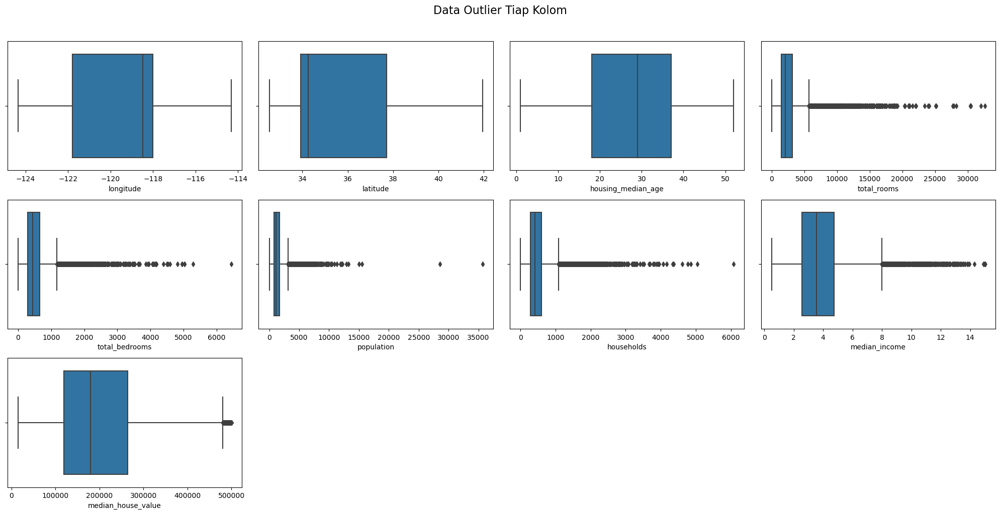

In [39]:
outlier_plot

In [40]:
df_outlier

,column,iqr,lower_whisker,min_data_range,upper_whisker,max_data_range,n_lower_outlier,n_upper_outlier,%_lower_outlier,%_upper_outlier
0,total_rooms,1690.0000,0,2.0000,5677.00000,32627.0000,0,906,0.0,6.0
1,total_bedrooms,352.0000,0,1.0000,1175.00000,6445.0000,0,880,0.0,6.0
2,population,938.0000,0,3.0000,3129.00000,35682.0000,0,823,0.0,6.0
3,households,324.5000,0,1.0000,1090.25000,6082.0000,0,836,0.0,6.0
4,median_income,2.1667,0,0.4999,7.98615,15.0001,0,477,0.0,3.0
5,median_house_value,144350.0000,0,14999.0000,480275.00000,500001.0000,0,751,0.0,5.0


In [41]:
print(f"Total data outlier : {df_outlier['%_upper_outlier'].sum()}%")

Total data outlier : 32.0%


Dalam mengatasi outlier kita tidak bisa menghapus data terlalu banyak, karena hal itu akan mengurangi range prediksi model machine learning yang akan kita buat dan dalam konteks harga rumah, outlier merupakan hal yang wajar adanya apalagi jika daerah yang kita observasi luas. 

Karena total data outlier cukup banyak kita akan membuang sebagian data outlier yang nilainya sangat jauh saja. Feature-feature yang kita akan handle outliernya adalah :
- total_rooms
- total_bedrooms
- population
- househoolds
- median_income

### Handling Outliers

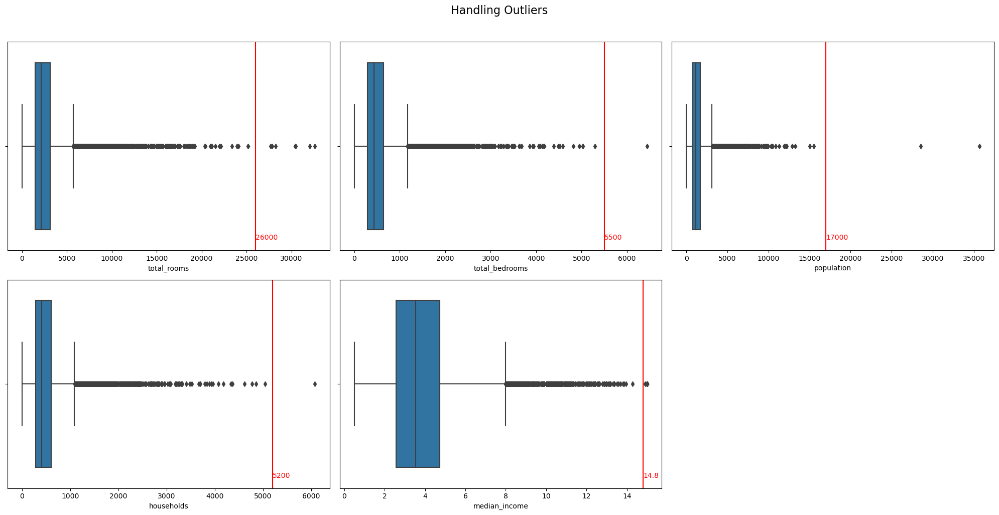

In [42]:
plt.figure(figsize= (20, 10))
plt.suptitle('Handling Outliers', fontsize= 16, y= 1.02)

for i,col in enumerate(df[['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']], start= 1):
    ax= plt.subplot(2, 3, i)
    sns.boxplot(data= df, x= col, ax= ax)
    if col == 'total_rooms':
        ax.axvline(x= 26000, color= 'red')
        ax.text(x= 26000, y= 0.45, s= 26000, color= 'red')
    elif col == 'total_bedrooms':
        ax.axvline(x= 5500, color= 'red')
        ax.text(x= 5500, y= 0.45, s= 5500, color= 'red')
    elif col == 'population':
        ax.axvline(x= 17000, color= 'red')
        ax.text(x= 17000, y= 0.45, s= 17000, color= 'red')
    elif col == 'households':
        ax.axvline(x= 5200, color= 'red')
        ax.text(x= 5200, y= 0.45, s= 5200, color= 'red')
    else:
        ax.axvline(x= 14.8, color= 'red')
        ax.text(x= 14.8, y= 0.45, s= 14.8, color= 'red')


plt.tight_layout()
outlier_plot = plt.gcf()

plt.show()

Ini adalah gambaran bagaimana kita akan Mengurangi outlier pada tiap feature. 

In [43]:
df_2 = df.copy()

#### Total_rooms

In [44]:
df_2 = df_2.drop((df_2[df_2['total_rooms'] > 26000]).index)

#### total_bedrooms

In [45]:
df_2 = df_2.drop((df_2[df_2['total_bedrooms'] > 5500]).index)

#### population

In [46]:
df_2 = df_2.drop((df_2[df_2['population'] > 17000]).index)

#### households

In [47]:
df_2 = df_2.drop((df_2[df_2['households'] > 5200]).index)

#### median_income

In [48]:
df_2 = df_2.drop((df_2[df_2['median_income'] > 14.8]).index)

In [49]:
print(f'''
Total data original:                 {len(df)}
Total data setelah handling outlier: {len(df_2)}
Total data dihapus = {len(df) - len(df_2)} atau {round(100 - (len(df_2) / len(df)) * 100, 2)}% dari dataset
''')


Total data original:                 14311
Total data setelah handling outlier: 14269
Total data dihapus = 42 atau 0.29% dari dataset



Total data yang dihapus sebanyak 42 atau 0.29% dari dataset. Sekarang kita akan coba melakukan cross validation dengan 2 model terbaik, lalu hasilnya akan dibandingkan dengan hasil cross validation pertama yang dats outliernya tidak dikurangi.

---
# Modeling Setelah Handle Outliers

---
## Define X, y

In [50]:
X2 = df_2.drop(columns= 'median_house_value')
y2 = df_2['median_house_value']

display(X2, y2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND
...,...,...,...,...,...,...,...,...,...
14442,-120.06,36.94,19.0,901.0,183.0,700.0,190.0,2.2375,INLAND
14443,-121.26,38.27,20.0,1314.0,229.0,712.0,219.0,4.4125,INLAND
14444,-120.89,37.48,27.0,1118.0,195.0,647.0,209.0,2.9135,INLAND
14446,-117.93,33.62,34.0,2125.0,498.0,1052.0,468.0,5.6315,<1H OCEAN


0         47500.0
1        100000.0
2        285800.0
3        175000.0
4         59200.0
           ...   
14442     64300.0
14443    144600.0
14444    159400.0
14446    484600.0
14447     69400.0
Name: median_house_value, Length: 14269, dtype: float64

---
## Data Splitting

In [51]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size= 0.2, random_state= 0)

---
## Define Data Transformation Method

In [52]:
transformer2 = ColumnTransformer([
    ('encoding', OneHotEncoder(), ['ocean_proximity']),
    ('scaling', StandardScaler(), X2.describe().columns) 
], remainder= 'passthrough')

---
## Cross Validation

In [53]:
list_all_model = [lr, knn, dt, rf, adb, gb, xgb]
list_all_metrics = ['r2', 'neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error']

list_model = []
list_metrics = []
list_score = []

list_mean_r2 = []
list_std_r2 = []

list_mean_rmse = []
list_std_rmse = []

list_mean_mae = []
list_std_mae = []

list_mean_mape = []
list_std_mape = []

for model in list_all_model:
    for metric in list_all_metrics:
        cv_model_2 = Pipeline([
            ('preprocessing', transformer2),
            ('model', model)
        ])

        cv_score = cross_val_score(
            estimator= cv_model_2,
            X= X_train2,
            y= y_train2,
            cv= 5,
            scoring= metric,
            error_score= 'raise'
        )

        if metric == 'r2':
            list_score.append(cv_score)
            list_mean_r2.append(cv_score.mean())
            list_std_r2.append(cv_score.std())
        elif metric == 'neg_root_mean_squared_error':
            list_score.append(cv_score)
            list_mean_rmse.append(cv_score.mean())
            list_std_rmse.append(cv_score.std())
        elif metric == 'neg_mean_absolute_error':
            list_score.append(cv_score)
            list_mean_mae.append(cv_score.mean())
            list_std_mae.append(cv_score.std())
        else:
            list_score.append(cv_score)
            list_mean_mape.append(cv_score.mean())
            list_std_mape.append(cv_score.std())

In [54]:
df_cv_2 = pd.DataFrame({
    'Model': ['LinearRegression_2', 'KNeighborsRegressor_2', 'DecisionTreeRegressor_2', 'RandomForestRegressor_2', 'AdaBoostRegressor_2', 'GradientBoostingRegressor_2', 'XGBRegressor_2'],
    'Mean_r2': list_mean_r2,
    'Std_r2': list_std_r2,
    'Mean_RMSE': list_mean_rmse,
    'Std_RMSE': list_std_rmse,
    'Mean_MAE': list_mean_mae,
    'Std_MAE': list_std_mae,
    'Mean_MAPE': list_mean_mape,
    'Std_MAPE': list_std_mape,
})

df_cv_2 = df_cv_2.sort_values('Mean_RMSE', ascending= False)
df_cv_2.head(2)

,Model,Mean_r2,Std_r2,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
6,XGBRegressor_2,0.810823,0.007086,-50013.047318,963.753143,-33519.555544,483.619179,-0.186386,0.004346
3,RandomForestRegressor_2,0.799194,0.006637,-51531.101458,982.759051,-34066.776586,618.879846,-0.189575,0.004493


In [55]:
merged_df_cv = pd.concat([df_cv.head(2), df_cv_2.head(2)], ignore_index=True).copy()
merged_df_cv.sort_values('Mean_RMSE', ascending= False)

,Model,Mean_r2,Std_r2,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
2,XGBRegressor_2,0.810823,0.007086,-50013.047318,963.753143,-33519.555544,483.619179,-0.186386,0.004346
0,XGBRegressor,0.811239,0.011080,-50077.155664,1028.280754,-33268.916927,364.670054,-0.184114,0.003008
1,RandomForestRegressor,0.800665,0.008942,-51475.740585,854.599620,-33765.020763,320.761948,-0.187840,0.003540
3,RandomForestRegressor_2,0.799194,0.006637,-51531.101458,982.759051,-34066.776586,618.879846,-0.189575,0.004493


Model dengan dataset yang dihapus outliernya tidak mengalami kenaikan performa yang signifikan, test selanjutnya untuk menentukan model terbaik adalah dengan melakukan predict terhadap test-set

# Test 4 Model Potensial ke Test Set

In [56]:
list_model = [xgb, rf]

rmse = []
mae = []
mape = []

for model in list_model:
    test_model_1 = Pipeline([
        ('preprocessing', transformer),
        ('model', model)
    ])

    test_model_1.fit(X_train, y_train)
    y_pred_1 = test_model_1.predict(X_test)
    rmse.append(np.sqrt(mean_squared_error(y_test, y_pred_1)))
    mae.append(mean_squared_error(y_test, y_pred_1))
    mape.append(mean_absolute_percentage_error(y_test, y_pred_1))

In [57]:
score_scenario_1 = pd.DataFrame({
    'Model': ['XGBRegressor_test_1', 'RandomForestRegressor_test_1'],
    'RMSE': rmse,
    'MAE': mae,
    'MAPE': mape
})

score_scenario_1

,Model,RMSE,MAE,MAPE
0,XGBRegressor_test_1,48607.627352,2.362701e+09,0.185803
1,RandomForestRegressor_test_1,49646.606968,2.464786e+09,0.184739


In [58]:
list_model = [xgb, rf]

rmse = []
mae = []
mape = []

for model in list_model:
    test_model_2 = Pipeline([
        ('preprocessing', transformer),
        ('model', model)
    ])

    test_model_2.fit(X_train2, y_train2)
    y_pred_2 = test_model_2.predict(X_test2)
    rmse.append(np.sqrt(mean_squared_error(y_test2, y_pred_2)))
    mae.append(mean_squared_error(y_test2, y_pred_2))
    mape.append(mean_absolute_percentage_error(y_test2, y_pred_2))

In [59]:
score_scenario_2 = pd.DataFrame({
    'Model': ['XGBRegressor_test_2', 'RandomForestRegressor_test_2'],
    'RMSE': rmse,
    'MAE': mae,
    'MAPE': mape
})

score_scenario_2

,Model,RMSE,MAE,MAPE
0,XGBRegressor_test_2,47539.85919,2.260038e+09,0.180907
1,RandomForestRegressor_test_2,48406.32943,2.343173e+09,0.182341


In [60]:
merged_test = pd.concat([score_scenario_1, score_scenario_2], ignore_index= True).copy()
merged_test

,Model,RMSE,MAE,MAPE
1,RandomForestRegressor_test_1,49646.606968,2.464786e+09,0.184739
0,XGBRegressor_test_1,48607.627352,2.362701e+09,0.185803
3,RandomForestRegressor_test_2,48406.329430,2.343173e+09,0.182341
2,XGBRegressor_test_2,47539.859190,2.260038e+09,0.180907


In [109]:
merged_test.sort_values('RMSE')

,Model,RMSE,MAE,MAPE
2,XGBRegressor_test_2,47539.859190,2.260038e+09,0.180907
3,RandomForestRegressor_test_2,48406.329430,2.343173e+09,0.182341
0,XGBRegressor_test_1,48607.627352,2.362701e+09,0.185803
1,RandomForestRegressor_test_1,49646.606968,2.464786e+09,0.184739


Berdasarkan hasil predict ke test-set, Model yang memiliki performa terbaik adalah XGBRegressor_2 yang outlier pada datasetnya dikurangi, tahap selanjutnya kita akan melakukan hyperparameter tuning pada model ini dengan tujuan untuk mencoba meningkatkan performa model

In [61]:
df_cv_2.loc[:, ['Model', 'Mean_RMSE', 'Mean_MAE', 'Mean_MAPE']].head(2)

,Model,Mean_RMSE,Mean_MAE,Mean_MAPE
6,XGBRegressor_2,-50013.047318,-33519.555544,-0.186386
3,RandomForestRegressor_2,-51531.101458,-34066.776586,-0.189575


Model ini menunjukkan performa yang lebih baik saat melakukan prediksi terhadap test set dibandingkan saat dievaluasi pada train set.

# **Hyperparameter Tuning Benchmark Model**

Karena keterbatasan hardware, pertama kita akan melakukan tuning dengan RandomizedSearch, setelah itu hasilnya akan kita evaluasi. Kemudian parameter dari 5 model terbaik dari RandomizedSearch berdasarkan RMSE akan kita coba tuning dengan GridSearch.

Hal ini kita lakukan karena RandomizedSearch memiliki sifat random, dimana ada kemungkinan model terbaik tidak masuk ke dalam proses tuning. Oleh karena kita tetap harus melakukan GridSearch sebagai proses tuning terakhir.

Keuntungan dari kita melakukan RandomizedSearch terlebih dahulu adalah untuk memperkecil range parameter yang harus kita masukkan ke dalam hyperparameter GridSearch, dengan metode ini kita bisa mengurangi beban komputasi saat melakukan GridSearch.

---
## Penjelasan Model

Model yang akan kita tuning adalah model dengan algoritma XGBRegressor. 

XGBRegressor adalah model machine learning yang termasuk dalam keluarga gradient boosting. Model ini dirancang khusus untuk tugas regresi, di mana tujuannya adalah untuk memprediksi nilai numerik kontinu. Model XGBRegressor bekerja dengan menggabungkan beberapa model decision tree ke dalam 1 model. Setiap decision tree dilatih untuk memperbaiki kesalahan yang dibuat oleh decision tree sebelumnya. Proses ini dilakukan secara sequential.

Pada setiap iterasi atau boosting round, XGBRegressor membangun decision tree dengan mempertimbangkan residual (selisih antara nilai prediksi dan nilai aktual) dari decision tree sebelumnya. Proses ini mengoptimalkan decision tree untuk mengurangi kesalahan prediksi pada iterasi berikutnya.

Dalam membangun decision tree, XGBRegressor menggunakan algoritma yang disebut "gradient boosting" yang menggabungkan prinsip penguatan gradien (gradient boosting) dan pruning untuk memperbaiki performa decision tree. Algoritma ini mencoba menurunkan residual dengan cara memilih pembagian terbaik pada setiap node dalam pohon.

Setelah decision tree dibangun pada setiap iterasi, hasil prediksi dari tree tersebut ditambahkan ke prediksi berikutnya. Hal ini dilakukan secara berurutan pada setiap boosting round, sehingga setiap decision tree berkontribusi dalam meningkatkan prediksi akhir.

---
## Hyperparameter

- encoding: Parameter ini mengacu pada metode encoding yang digunakan untuk mengubah variabel kategorikal menjadi numerikal agar bisa diproses oleh model. Metode yang akan kita coba tuning adalah:
    - OneHot encoder : Metode ini akan menambahkan kolom dan mengubah nilai unik dari kolom yang di encoding menjadi 0 dan 1. Jumlah kolom yang dibuat sebanyak jumlah nilai unik pada kolom tersebut.
    - Binary encoder : Metode ini juga akan menambahkan kolom, namun dengan cara mengubah jumlah nilai unik menjadi representasi bilangan biner. Jumlah kolom yang dihasilkan sesuai dengan jumlah digit dalam representasi bilangan biner.

- scaling: Parameter ini mengacu pada metode scaling atau penyesuaian skala yang digunakan pada fitur-fitur numerik. Metode yang akan kita coba tuning adalah:
    - Standard scaler : Metode ini menggunakan mean dan standar deviasi untuk mengubah skala. Metode ini menghasilkan data yang berpusat pada 0 dengan standar deviasi bernilai 1.
    - Robust scaler : Metode ini menggunakan median dan quartile untuk mengubah skala fitur. Metode ini membuat pengaruh outlier berkurang terhadap hasil model
    - MinMax scaler : Metode ini mengubah rentang nilai data menjadi 0 dan 1. Metode ini sangat sensitif terhadap outlier

- n_estimators: Parameter ini menentukan jumlah decision tree (estimator) yang akan dibangun dalam model. Semakin banyak estimator, semakin kompleks model dan waktu komputasi yang dibutuhkan akan semakin lama.

- max_depth: Parameter ini mengontrol kedalaman maksimum dari setiap decision tree. Kedalaman mempengaruhi kompleksitas model. Memilih nilai yang tepat dapat mencegah overfitting atau underfitting.

- grow_policy: Parameter ini mengatur strategi pertumbuhan (growing) pohon dalam model. Pilihan default adalah 'depthwise', pilihin ini menambahkan node secara berurutan pada setiap level, pilihan kedua adalah 'lossguide', pilihan ini  memprioritaskan pembagian node yang memberikan perubahan nilai error yang paling signifikan.

- learning_rate: Parameter ini mengontrol seberapa cepat atau lambat model belajar dari data. Learning rate yang tinggi menyebabkan model dapat dengan cepat belajar dari data, namun terdapat kecenderungan overfitting jika nilainya terlalu tinggi

- gamma: Parameter ini mengontrol seberapa banyak loss yang diperlukan untuk melakukan splitting, semakin besar nilai gamma maka perubahan nilai error yang diperlukan untuk melakukan splitting juga semakin tinggi

- reg_alpha dan reg_lambda: Parameter-parameter ini adalah teknik regularisasi yang digunakan untuk mencegah overfitting pada model. reg_alpha adalah regularisasi L1 yang menambahkan komponen penalti berdasarkan nilai absolut dari koefisien, sedangkan reg_lambda adalah regularisasi L2 yang menambahkan komponen penalti berdasarkan nilai kuadrat dari koefisien. Kombinasi dari 2 parameter ini menghasilkan metode elastic net

In [62]:
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from category_encoders import OrdinalEncoder, BinaryEncoder

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

## RandomizedSearch

In [63]:
transformer2 = ColumnTransformer([
    ('encoding', OneHotEncoder(), ['ocean_proximity']),
    ('scaling', StandardScaler(), X2.describe().columns) 
], remainder= 'passthrough')

In [64]:
# Kode ini untuk meiihat parameter apa saja yang ada di XGBRegresor
# ?XGBRegressor

In [65]:
pipe_model = Pipeline([
    ('preprocessing', transformer2),
    ('modeling', xgb)
])

param_dist = {
    'preprocessing__encoding': [OneHotEncoder(), BinaryEncoder()],
    'preprocessing__scaling': [StandardScaler(), RobustScaler(), MinMaxScaler()],
    'modeling__n_estimators': range(100, 1001, 100),
    'modeling__max_depth': [6, 8, 10, 12],
    'modeling__grow_policy': ['depthwise', 'lossguide'],
    'modeling__learning_rate': [0.1, 0.05, 0.01],
    'modeling__gamma': [0, 0.5, 1],
    'modeling__reg_alpha': [0.01, 0.1, 0, 1],
    'modeling__reg_lambda': [0.01, 0.1, 0, 1]
}

random_search = RandomizedSearchCV(
    estimator= pipe_model,
    param_distributions= param_dist,
    cv= 5,
    scoring= ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'],
    n_jobs= -1,
    n_iter= 1000,
    refit= 'neg_root_mean_squared_error',
    random_state= 0,
    error_score= 'raise'
)

In [66]:
random_search.fit(X_train2, y_train2)

RandomizedSearchCV(cv=5, error_score='raise',
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('encoding',
                                                                               OneHotEncoder(),
                                                                               ['ocean_proximity']),
                                                                              ('scaling',
                                                                               StandardScaler(),
                                                                               Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income'],
      dtype...
                                        'modeling__reg_alpha': [0.01, 0.1, 0,
                                                                1],
                                        'modeling__reg_lambda': [0.01, 0.1, 0,
                                                                 1],
                                        'preprocessing__encoding': [OneHotEncoder(),
                                                                    BinaryEncoder()],
                                        'preprocessing__scaling': [StandardScaler(),
                                                                   RobustScaler(),
                                                                   MinMaxScaler()]},
                   random_state=0, refit='neg_root_mean_squared_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [67]:
random_search.best_score_

-48248.80588671959

In [68]:
random_search.best_params_

{'preprocessing__scaling': RobustScaler(),
 'preprocessing__encoding': OneHotEncoder(),
 'modeling__reg_lambda': 1,
 'modeling__reg_alpha': 1,
 'modeling__n_estimators': 900,
 'modeling__max_depth': 8,
 'modeling__learning_rate': 0.05,
 'modeling__grow_policy': 'lossguide',
 'modeling__gamma': 0.5}

In [69]:
pd.set_option('display.max_columns', None)

In [70]:
print(pd.DataFrame(random_search.cv_results_).columns)

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_preprocessing__scaling', 'param_preprocessing__encoding',
       'param_modeling__reg_lambda', 'param_modeling__reg_alpha',
       'param_modeling__n_estimators', 'param_modeling__max_depth',
       'param_modeling__learning_rate', 'param_modeling__grow_policy',
       'param_modeling__gamma', 'params',
       'split0_test_neg_root_mean_squared_error',
       'split1_test_neg_root_mean_squared_error',
       'split2_test_neg_root_mean_squared_error',
       'split3_test_neg_root_mean_squared_error',
       'split4_test_neg_root_mean_squared_error',
       'mean_test_neg_root_mean_squared_error',
       'std_test_neg_root_mean_squared_error',
       'rank_test_neg_root_mean_squared_error',
       'split0_test_neg_mean_absolute_error',
       'split1_test_neg_mean_absolute_error',
       'split2_test_neg_mean_absolute_error',
       'split3_test_neg_mean_absolute_error',
       'split4_test_neg_mea

In [71]:
score_tuning_random = pd.DataFrame(random_search.cv_results_)[['param_preprocessing__scaling', 'param_preprocessing__encoding',
       'param_modeling__reg_lambda', 'param_modeling__reg_alpha',
       'param_modeling__n_estimators', 'param_modeling__max_depth',
       'param_modeling__learning_rate', 'param_modeling__grow_policy',
       'param_modeling__gamma', 'mean_test_neg_root_mean_squared_error',
       'std_test_neg_root_mean_squared_error',
       'rank_test_neg_root_mean_squared_error',  'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error',
       'rank_test_neg_mean_absolute_error','mean_test_neg_mean_absolute_percentage_error',
       'std_test_neg_mean_absolute_percentage_error',
       'rank_test_neg_mean_absolute_percentage_error']].sort_values('rank_test_neg_root_mean_squared_error')

score_tuning_random.head(5).sort_values('rank_test_neg_root_mean_squared_error')

,param_preprocessing__scaling,param_preprocessing__encoding,param_modeling__reg_lambda,param_modeling__reg_alpha,param_modeling__n_estimators,param_modeling__max_depth,param_modeling__learning_rate,param_modeling__grow_policy,param_modeling__gamma,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
668,RobustScaler(),OneHotEncoder(),1,1,900,8,0.05,lossguide,0.5,-48248.805887,1422.261812,1,-31483.565197,847.428987,1,-0.172427,0.005631,1
0,StandardScaler(),OneHotEncoder(),1,0.1,1000,8,0.05,lossguide,0,-48283.973363,1396.058629,2,-31529.713254,865.964383,2,-0.172569,0.005565,2
711,StandardScaler(),OneHotEncoder(),1,0,1000,8,0.05,lossguide,0.5,-48297.176744,1405.721596,3,-31564.133872,889.318016,3,-0.172667,0.005603,3
414,StandardScaler(),OneHotEncoder(),1,0,900,8,0.05,lossguide,0,-48309.311387,1420.158900,4,-31571.632323,888.232725,4,-0.172686,0.005547,4
843,RobustScaler(),OneHotEncoder(),1,0.1,400,8,0.05,depthwise,0.5,-48440.290553,1355.454642,5,-31715.448961,848.437789,9,-0.173745,0.005247,23


In [72]:
score_tuning_random.loc[score_tuning_random['rank_test_neg_root_mean_squared_error'] == 1, ['mean_test_neg_root_mean_squared_error', 'std_test_neg_root_mean_squared_error', 'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error', 'std_test_neg_mean_absolute_percentage_error']]

,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
668,-48248.805887,1422.261812,-31483.565197,847.428987,-0.172427,0.005631


In [73]:
df_cv_2.loc[df_cv_2['Model'] == 'XGBRegressor_2', 'Mean_RMSE':]

,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
6,-50013.047318,963.753143,-33519.555544,483.619179,-0.186386,0.004346


Berdasarkan hasil RandomizedSearch performa model mengalami kenaikan dimana sebelum dilakukan tuning nilai RMSE adalah 50013.047, setelah dilakukan tuning nilai RMSE turun menjadi 48248.805

Selanjutnya kita akan coba melakukan gridsearch menggunakan range parameter dari top 5 randomized search

---
## GridSearch

In [74]:
pipe_model = Pipeline([
    ('preprocessing', transformer2),
    ('modeling', xgb)
])

hyper_parameter = {
    'preprocessing__encoding': [OneHotEncoder()],
    'preprocessing__scaling': [StandardScaler(), RobustScaler()],
    'modeling__n_estimators': [900, 1000],
    'modeling__max_depth': [8],
    'modeling__grow_policy': ['depthwise', 'lossguide'],
    'modeling__learning_rate': [0.05],
    'modeling__gamma': [0, 0.5],
    'modeling__reg_alpha': [0.1, 0, 1],
    'modeling__reg_lambda': [1]
}

grid_search = GridSearchCV(
    estimator= pipe_model,
    param_grid= hyper_parameter,
    cv= 5,
    scoring= ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'],
    n_jobs= -1,
    refit= 'neg_root_mean_squared_error',
    error_score= 'raise'
)

In [75]:
grid_search.fit(X_train2, y_train2)

GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('encoding',
                                                                         OneHotEncoder(),
                                                                         ['ocean_proximity']),
                                                                        ('scaling',
                                                                         StandardScaler(),
                                                                         Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income'],
      dtype='obje...
                         'modeling__max_depth': [8],
                         'modeling__n_estimators': [900, 1000],
                         'modeling__reg_alpha': [0.1, 0, 1],
                         'modeling__reg_lambda': [1],
                         'preprocessing__encoding': [OneHotEncoder()],
                         'preprocessing__scaling': [StandardScaler(),
                                                    RobustScaler()]},
             refit='neg_root_mean_squared_error',
             scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error',
                      'neg_mean_absolute_percentage_error'])

In [76]:
score_tuning_grid = pd.DataFrame(grid_search.cv_results_)[['param_preprocessing__scaling', 'param_preprocessing__encoding',
       'param_modeling__reg_lambda', 'param_modeling__reg_alpha',
       'param_modeling__n_estimators', 'param_modeling__max_depth',
       'param_modeling__learning_rate', 'param_modeling__grow_policy',
       'param_modeling__gamma', 'params', 'mean_test_neg_root_mean_squared_error',
       'std_test_neg_root_mean_squared_error',
       'rank_test_neg_root_mean_squared_error',  'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error',
       'rank_test_neg_mean_absolute_error','mean_test_neg_mean_absolute_percentage_error',
       'std_test_neg_mean_absolute_percentage_error',
       'rank_test_neg_mean_absolute_percentage_error']].sort_values('rank_test_neg_root_mean_squared_error')

score_tuning_grid.head(25).sort_values('std_test_neg_root_mean_squared_error')

,param_preprocessing__scaling,param_preprocessing__encoding,param_modeling__reg_lambda,param_modeling__reg_alpha,param_modeling__n_estimators,param_modeling__max_depth,param_modeling__learning_rate,param_modeling__grow_policy,param_modeling__gamma,params,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
37,RobustScaler(),OneHotEncoder(),1,0.1,900,8,0.05,lossguide,0.5,"{'modeling__gamma': 0.5, 'modeling__grow_policy': 'lossguide', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 900, 'modeling__reg_alpha': 0.1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotEncoder(), 'preprocessing__scaling': RobustScaler()}",-48284.677100,1395.298475,25,-31534.297349,870.643276,29,-0.172560,0.005582,21
30,StandardScaler(),OneHotEncoder(),1,0.1,1000,8,0.05,depthwise,0.5,"{'modeling__gamma': 0.5, 'modeling__grow_policy': 'depthwise', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 1000, 'modeling__reg_alpha': 0.1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotEncoder(), 'preprocessing__scaling': StandardScaler()}",-48283.973363,1396.058629,21,-31529.713254,865.964383,17,-0.172569,0.005565,25
18,StandardScaler(),OneHotEncoder(),1,0.1,1000,8,0.05,lossguide,0,"{'modeling__gamma': 0, 'modeling__grow_policy': 'lossguide', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 1000, 'modeling__reg_alpha': 0.1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotEncoder(), 'preprocessing__scaling': StandardScaler()}",-48283.973363,1396.058629,21,-31529.713254,865.964383,17,-0.172569,0.005565,25
42,StandardScaler(),OneHotEncoder(),1,0.1,1000,8,0.05,lossguide,0.5,"{'modeling__gamma': 0.5, 'modeling__grow_policy': 'lossguide', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 1000, 'modeling__reg_alpha': 0.1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotEncoder(), 'preprocessing__scaling': StandardScaler()}",-48283.973363,1396.058629,21,-31529.713254,865.964383,17,-0.172569,0.005565,25
6,StandardScaler(),OneHotEncoder(),1,0.1,1000,8,0.05,depthwise,0,"{'modeling__gamma': 0, 'modeling__grow_policy': 'depthwise', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 1000, 'modeling__reg_alpha': 0.1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotEncoder(), 'preprocessing__scaling': StandardScaler()}",-48283.973363,1396.058629,21,-31529.713254,865.964383,17,-0.172569,0.005565,25
40,StandardScaler(),OneHotEncoder(),1,1,900,8,0.05,lossguide,0.5,"{'modeling__gamma': 0.5, 'modeling__grow_policy': 'lossguide', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 900, 'modeling__reg_alpha': 1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotEncoder(), 'preprocessing__scaling': StandardScaler()}",-48266.722971,1402.658748,13,-31490.604949,835.545070,13,-0.172463,0.005547,13
28,StandardScaler(),OneHotEncoder(),1,1,900,8,0.05,depthwise,0.5,"{'modeling__gamma': 0.5, 'modeling__grow_policy': 'depthwise', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 900, 'modeling__reg_alpha': 1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotEncoder(), 'preprocessing__scaling': StandardScaler()}",-48266.722971,1402.658748,13,-31490.604949,835.545070,13,-0.172463,0.005547,13
16,StandardScaler(),OneHotEncoder(),1,1,900,8,0.05,lossguide,0,"{'modeling__gamma': 0, 'modeling__grow_policy': 'lossguide', 'modeling__learning_rate': 0.05, 'modeling__max_depth': 8, 'modeling__n_estimators': 900, 'modeling__reg_alpha': 1, 'modeling__reg_lambda': 1, 'preprocessing__encoding': OneHotE

In [77]:
grid_search.best_score_

-48234.01219573817

In [78]:
grid_search.best_params_

{'modeling__gamma': 0,
 'modeling__grow_policy': 'depthwise',
 'modeling__learning_rate': 0.05,
 'modeling__max_depth': 8,
 'modeling__n_estimators': 1000,
 'modeling__reg_alpha': 1,
 'modeling__reg_lambda': 1,
 'preprocessing__encoding': OneHotEncoder(),
 'preprocessing__scaling': RobustScaler()}

Score GridSearch Best Model by Mean

In [79]:
score_tuning_grid.loc[[23], ['mean_test_neg_root_mean_squared_error', 'std_test_neg_root_mean_squared_error', 'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error', 'std_test_neg_mean_absolute_percentage_error']].head(1)

,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
23,-48234.012196,1429.924352,-31473.353389,862.144703,-0.172395,0.005698


Score GridSearch Best Model by Std

In [80]:
score_tuning_grid.loc[[37], ['mean_test_neg_root_mean_squared_error', 'std_test_neg_root_mean_squared_error', 'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error', 'std_test_neg_mean_absolute_percentage_error']].head(1)

,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
37,-48284.6771,1395.298475,-31534.297349,870.643276,-0.17256,0.005582


Score RandomSearrch

In [81]:
score_tuning_random.loc[score_tuning_random['rank_test_neg_root_mean_squared_error'] == 1, ['mean_test_neg_root_mean_squared_error', 'std_test_neg_root_mean_squared_error', 'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error', 'std_test_neg_mean_absolute_percentage_error']]

,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
668,-48248.805887,1422.261812,-31483.565197,847.428987,-0.172427,0.005631


Score Cross Validation

In [82]:
df_cv_2.loc[df_cv_2['Model'] == 'XGBRegressor_2', 'Mean_RMSE':]

,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
6,-50013.047318,963.753143,-33519.555544,483.619179,-0.186386,0.004346


Terjadi peningkatan performa berdasarkan Mean pada hasil tuning dengan GridSearch, namun nilai std naik sedikit. Dari hasil GridSearch kita juga melihat bahwa nilai mean dari top 25 model tidak berbeda jauh, oleh karena itu kita juga akan mencoba mengetes hasil tuning dengan std yang lebih kecil.

---
# Test Model Hasil Tuning ke Test Set

## Best Model by Mean

In [83]:
# define model
tuned_model = grid_search.best_estimator_

rmse_tuned = []
mae_tuned = []
mape_tuned = []

# fit
tuned_model.fit(X_train2, y_train2)

# predict
y_pred_tuned = tuned_model.predict(X_test2)

# Metrics
rmse_tuned.append(np.sqrt(mean_squared_error(y_test2, y_pred_tuned)))
mae_tuned.append(mean_squared_error(y_test2, y_pred_tuned))
mape_tuned.append(mean_absolute_percentage_error(y_test2, y_pred_tuned))

In [84]:
score_tuned_model = pd.DataFrame({
    'Model': 'XGBRegressor',
    'RMSE': rmse_tuned,
    'MAE': mae_tuned,
    'MAPE': mape_tuned
})

score_tuned_model

,Model,RMSE,MAE,MAPE
0,XGBRegressor,45105.552371,2.034511e+09,0.166634


## Best Model by Std

In [85]:
score_tuning_grid.loc[37, 'params']

{'modeling__gamma': 0.5,
 'modeling__grow_policy': 'lossguide',
 'modeling__learning_rate': 0.05,
 'modeling__max_depth': 8,
 'modeling__n_estimators': 900,
 'modeling__reg_alpha': 0.1,
 'modeling__reg_lambda': 1,
 'preprocessing__encoding': OneHotEncoder(),
 'preprocessing__scaling': RobustScaler()}

In [86]:
xgb_std = XGBRegressor(
    random_state= 0,
    gamma= 0.5,
    grow_policy= 'lossguide',
    learning_rate= 0.05,
    max_depth= 8,
    n_estimators= 900,
    reg_alpha= 0.1,
    reg_lambda= 1     
)

In [87]:
transformer_tuned_std = ColumnTransformer([
    ('encoding', OneHotEncoder(), ['ocean_proximity']),
    ('scaling', RobustScaler(), X2.describe().columns) 
], remainder= 'passthrough')

In [88]:
xgb_std = XGBRegressor(
    random_state= 0,
    gamma= 0.5,
    grow_policy= 'lossguide',
    learning_rate= 0.05,
    max_depth= 8,
    n_estimators= 900,
    reg_alpha= 0.1,
    reg_lambda= 1     
)

transformer_tuned_std = ColumnTransformer([
    ('encoding', OneHotEncoder(), ['ocean_proximity']),
    ('scaling', RobustScaler(), X2.describe().columns) 
], remainder= 'passthrough')

best_model_std = Pipeline([
    ('preprocessing', transformer_tuned_std),
    ('model', xgb_std)
])

rmse_tuned_std = []
mae_tuned_std = []
mape_tuned_std = []

best_model_std.fit(X_train2, y_train2)
y_pred_tuned_std = best_model_std.predict(X_test2)
rmse_tuned_std = (np.sqrt(mean_squared_error(y_test2, y_pred_tuned_std)))
mae_tuned_std = mean_squared_error(y_test2, y_pred_tuned_std)
mape_tuned_std = (mean_absolute_percentage_error(y_test2, y_pred_tuned_std))

In [89]:
score_tuned_std = pd.DataFrame({
    'Model': ['XGBRegressor'],
    'RMSE': rmse_tuned_std,
    'MAE': mae_tuned_std,
    'MAPE': mape_tuned_std
})

score_tuned_std

,Model,RMSE,MAE,MAPE
0,XGBRegressor,45240.693045,2.046720e+09,0.166802


## Score Benchmark Model

In [90]:
score_scenario_2.head(1)

,Model,RMSE,MAE,MAPE
0,XGBRegressor_test_2,47539.85919,2.260038e+09,0.180907


In [91]:
display(score_tuned_model, score_tuned_std, score_scenario_2.head(1))

,Model,RMSE,MAE,MAPE
0,XGBRegressor,45105.552371,2.034511e+09,0.166634


,Model,RMSE,MAE,MAPE
0,XGBRegressor,45240.693045,2.046720e+09,0.166802


,Model,RMSE,MAE,MAPE
0,XGBRegressor_test_2,47539.85919,2.260038e+09,0.180907


Model setelah tuning mengalami peningkatan performa dalam memprediksi target pada test-set, dimana nilai RMSE model tanpa tuning adalah sebesar 47539.859 sedangkan nilai RMSE pada model setelah tuning adalah 45105.55 (best model by mean) dan 45240.693 (best model by std).

Untuk menentukan model akhir yang akan kita gunakan kita akan melihat residual plot dari best model by mean dan best model by std.

---
# **Evaluasi Model dengan Residual Plot**

## Residual Plot

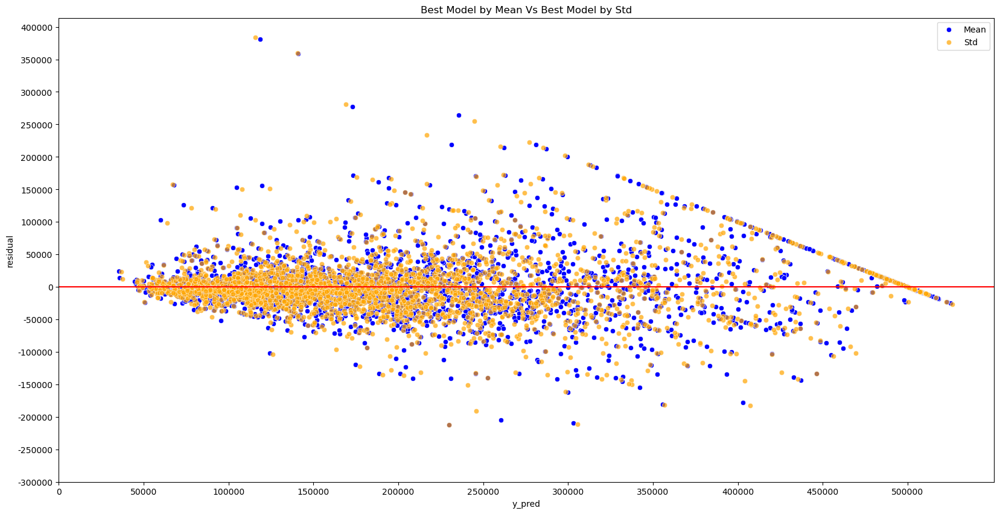

In [92]:
plt.figure(figsize= (20, 10))

plt.title('Best Model by Mean Vs Best Model by Std')
sns.scatterplot(x=y_pred_tuned, y= y_test2 - y_pred_tuned, color= 'blue')
sns.scatterplot(x=y_pred_tuned_std, y= y_test2 - y_pred_tuned_std, color= 'orange', alpha= 0.7)

plt.axhline(0, color='red')

x_tick_values = range(0, 500001, 50000)
y_tick_values = range(-300000, 400001, 50000)
x_tick_labels = [val for val in x_tick_values]
y_tick_labels = [val for val in y_tick_values]
plt.xticks(x_tick_values, x_tick_labels)
plt.yticks(y_tick_values, y_tick_labels)

plt.xlabel('y_pred')
plt.ylabel('residual');
plt.legend(['Mean', 'Std'])

plt.show()

Tikdak ada perbedaan yang signifikan antara model yang berfokus dalam menurunkan mean ataupun std. 2 Model ini valid digunakan sebagai final model karena nilai evaluasi metric kedua model ini tidak berbeda jauh, untuk project ini saya akan menggunakan model dengan nilai RMSE paling kecil.

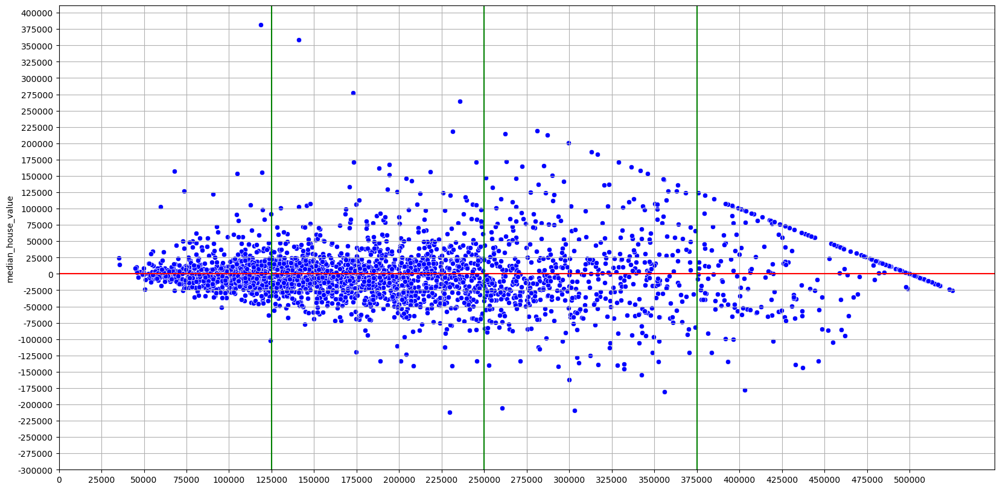

In [93]:
plt.figure(figsize= (20, 10))

sns.scatterplot(x= y_pred_tuned, y= y_test2 - y_pred_tuned, color= 'blue')
plt.axhline(0, color='red')

for val in range(125000, 375001, 125000):
    plt.axvline(val, color='green')

x_tick_values = range(0, 500001, 25000)
y_tick_values = range(-300000, 400001, 25000)
x_tick_labels = [val for val in x_tick_values]
y_tick_labels = [val for val in y_tick_values]
plt.xticks(x_tick_values, x_tick_labels)
plt.yticks(y_tick_values, y_tick_labels)
plt.xticks(x_tick_values, x_tick_labels)
plt.grid(True)

plt.show()

Plot ini menggambarkan persebaran nilai error terhadap harga aktual, garis merah pada plot menggambarkan prediksi sempurna. Dari plot di atas kita bisa melihat bahwa pada nilai yang rendah (< 125000) model cenderung melakukan overestimate dimana nilai prediksi lebih tinggi dibandingkan nilai aktual, lalu sampai nilai sekitar 375000 persebaran error pada model melebar, lalu di atas 375000 persebaran error mulai mengecil.

Kita dapat mengevaluasi model dengan melakukan segmentasi berdasarkan persebaran nilai residual hasil diprediksi. Dengan melakukan segmentasi, kita dapat mengidentifikasi rentang nilai di mana model kita paling baik dalam memprediksi. Gambaran segmentasi yang akan kita lakukan divisualisasikan dengan garis hijau pada plot

## Hasil Prediksi Berdasarkan Segmentasi

In [94]:
y_test_s1 = y_test2[y_test2 <= 125000]
y_test_s2 = y_test2[y_test2.between(125000, 250000)]
y_test_s3 = y_test2[y_test2.between(250000, 375000)] 
y_test_s4 = y_test2[y_test2 >= 375000]

In [95]:
X_segmen_1 = X_test2.loc[y_test2[y_test2 <= 125000].index]
X_segmen_2 = X_test2.loc[y_test2[y_test2.between(125000, 250000)].index]
X_segmen_3 = X_test2.loc[y_test2[y_test2.between(250000, 375000)].index]
X_segmen_4 = X_test2.loc[y_test2[y_test2 >= 375000].index]

In [96]:
list_segmen = [X_segmen_1, X_segmen_2, X_segmen_3, X_segmen_4]
list_y_test = [y_test_s1, y_test_s2, y_test_s3, y_test_s4]

rmse = []
mae = []
mape = []

for segmen, y_test_segmen in zip(list_segmen, list_y_test):
    test_segmen = grid_search.best_estimator_

    test_segmen.fit(X_train2, y_train2)
    y_pred_segmen = test_segmen.predict(segmen)
    rmse.append(np.sqrt(mean_squared_error(y_test_segmen, y_pred_segmen)))
    mae.append(mean_squared_error(y_test_segmen, y_pred_segmen))
    mape.append(mean_absolute_percentage_error(y_test_segmen, y_pred_segmen))


In [97]:
segment_names = ['Segment 1', 'Segment 2', 'Segment 3', 'Segment 4']
ranges = ['<= 125000', '125000 - 250000', '250000 - 375000', '>= 375000']
score_segment = pd.DataFrame({
    'Segment': segment_names,
    'Range': ranges,
    'RMSE': rmse,
    'MAE': mae,
    'MAPE': mape
})

score_segment

,Segment,Range,RMSE,MAE,MAPE
0,Segment 1,<= 125000,29860.036682,8.916218e+08,0.231068
1,Segment 2,125000 - 250000,36579.055812,1.338027e+09,0.147350
2,Segment 3,250000 - 375000,54053.568819,2.921788e+09,0.137241
3,Segment 4,>= 375000,84345.930297,7.114236e+09,0.128802


Model ini memiliki prediksi terbaik di range nilai di atas 375000, sementara prediksi terburuk ada di range nilai di bawah 125000

---
# **Feature Importance**

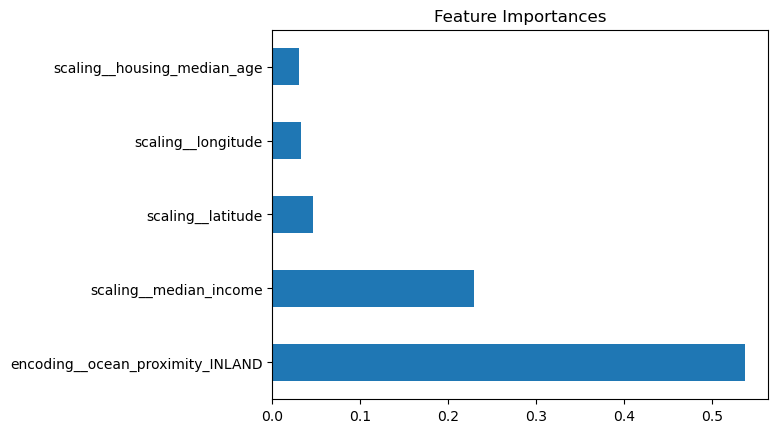

In [98]:
feature_imp = pd.Series(tuned_model['modeling'].feature_importances_, tuned_model['preprocessing'].get_feature_names_out()).sort_values(ascending = False).head()
feature_imp.plot(kind='barh', title='Feature Importances');

Output dari plot ini tidak menampilkan semua kolom feature karena feature terkena penalti oleh parameter regularisasi alpha. Regularisasi alpha bisa membuat coeffisien dari feature yang terkena penalti bernilai 0.

- Hasil dari feature importance sesuai dengan EDA yang sudah kita lakukan dimana memang ada korelasi kuat antara median_income dengan median_house_value. 
- Median house value juga memiliki hubungan dengan lokasi dimana rumah itu berada, dimana ada kecenderungan rumah dengan lokasi dekat dengan laut memiliki harga yang lebih mahal.

Dari sini kita bisa simpulkan bahwa lokasi dan pendapatan adalah feature yang paling mempengaruhi harga rumah, karakteristik dari rumah seperti jumlah kamar dan umur dari rumah itu sendiri tidak terlalu berpengaruh terhadap harga rumah.

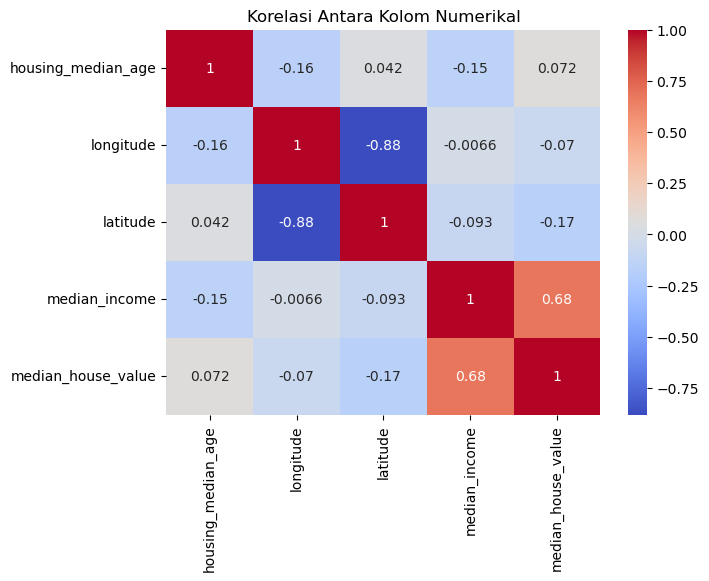

In [99]:
plt.figure(figsize= (7, 5))
sns.heatmap(data= df[['housing_median_age', 'longitude', 'latitude', 'median_income', 'ocean_proximity', 'median_house_value']].corr(method= 'spearman'), annot= True, cmap= 'coolwarm')
plt.title('Korelasi Antara Kolom Numerikal')

plt.show()

Longtitude dan latitude mempunyai pengaruh terhadap hasil prediksi, hal ini bisa jadi karena memang ada beberapa lokasi dimana jumlah rumahnya sangat banyak. Pada koordinat ini juga terdapat median_income dan median_house_value yang tinggi. Informasi ini bisa kita visualisasikan dengan plot histogram dan scatter map-box

In [100]:
df_segmen = df.copy()

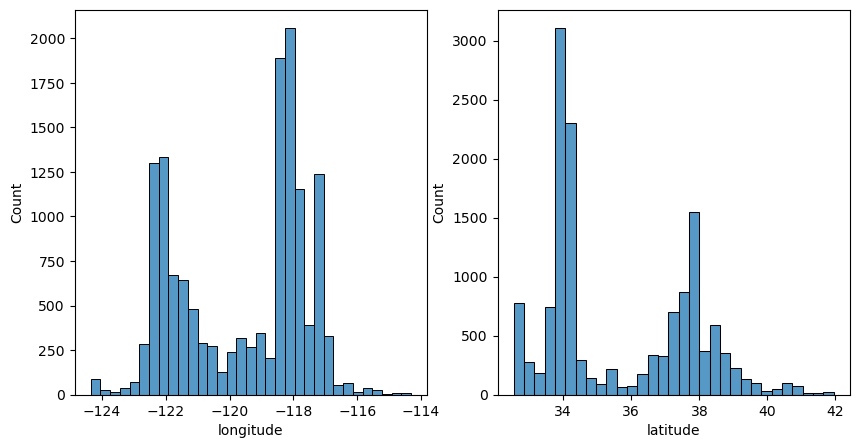

In [101]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.histplot(data=df_segmen['longitude'])

plt.subplot(1, 2, 2)
sns.histplot(data=df_segmen['latitude'])

plt.show()

Dua puncak dari longitude dan latitude menandakan ada banyak rumah pada koordinat tersebut.

In [102]:
def segmentation(price):
    if price <= 125000:
        return 'segmen 1'
    elif price >= 125000 and price <= 250000:
        return 'segmen 2' 
    elif price >= 250000 and price <= 375000:
        return 'segmen 3'
    else:
        return 'segmen 4'

df_segmen['segmen'] = df_segmen['median_house_value'].apply(segmentation)

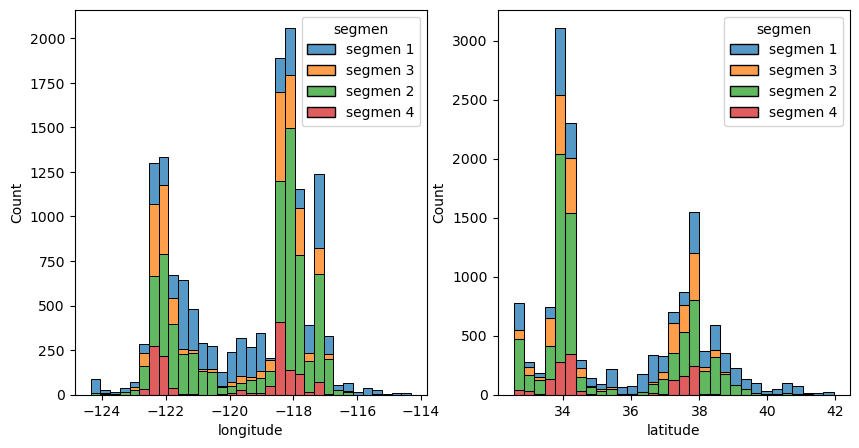

In [103]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.histplot(data=df_segmen, x='longitude', hue='segmen', multiple='stack')

plt.subplot(1, 2, 2)
sns.histplot(data=df_segmen, x='latitude', hue='segmen', multiple='stack')

plt.show()


Pada koordinat puncak juga memiliki banyak rumah yang memiliki harga tinggi, melalui EDA kita juga mengetahui bahwa median_house_value dan median_income memiliki korelasi dimana jika median_income tinggi terdapat kecenderungan bahwa median_house_value juga tinggi.

In [104]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_data=["median_income", "ocean_proximity"],
                        color="median_income", zoom=4, height=500)

fig.update_traces(marker=dict(size=10))

fig.update_layout(mapbox_style="open-street-map", title= 'Persebaran Lokasi Median Income')

fig.show()

Kita juga bisa memvisualisasikan dengan scatter map_box untuk melihat informasi tersebut dalam bentuk peta interaktif.

---
# **Limitasi Model**

- Hasil prediksi model masih cenderung menghasilkan nilai yang agak tinggi (overestimate) atau agak rendah (underestimate)
- Karena limitasi hardware, range parameter yang digunakan saat hyperparameter tuning masih terlalu sedikit. Jika kita lihat dari residual plot, ada kemungkinan kita bisa mendapatkan hasil yang lebih baik dengan model yang lebih kompleks
- Model ini hanya memberikan hasil prediksi yang baik pada rentang fitur yang terdapat dalam dataset.

Berikut adalah rentang fitur dalam dataset :

In [105]:
list_min = []
list_max = []
for column in df.iloc[:, :-2].columns:
    min_range = df[column].min()
    max_range = df[column].max()

    list_min.append(min_range)
    list_max.append(max_range)

In [106]:
range_feature = pd.DataFrame({
    'Feature' : df.iloc[:, :-2].columns,
    'min_range' : list_min,
    'max_range' : list_max
})
range_feature

,Feature,min_range,max_range
0,longitude,-124.3500,-114.3100
1,latitude,32.5400,41.9500
2,housing_median_age,1.0000,52.0000
3,total_rooms,2.0000,32627.0000
4,total_bedrooms,1.0000,6445.0000
5,population,3.0000,35682.0000
6,households,1.0000,6082.0000
7,median_income,0.4999,15.0001


---
# **Kesimpulan**

**Kesimpulan dari Segi Model**
- Model terbaik berdasarkan cross validation adalah XGBRegressor
- Terjadi peningkatan performa setelah dilakukan tuning pada benchmark model
- Model akhir yang kita pakai adalah model XGBRegressor terbaik berdasarkan mean, karena model ini memiliki nilai MRSE paling kecil
- Model memiliki performa terbaik saat mempredisi nilai di atas 375000 (segmen 4)
- Metode preprocesiing terbaik untuk modeling :
    - encoding = OneHotEncoder
    - scaling = RobustScaler
- Parameter terbaik untuk modeling :
    - gamma = 0.5
    - grow_policy = 'lossguide
    - learning_rate = 0.05
    - max_depth = 8
    - n_estimator = 900
    - reg_alpha = 0.1
    - reg_lambda = 1
- Feature yang berpengaruh terhadap median_house_value adalah median_income dan ocean_proximity


**Kesimpulan dari Segi Business**

Machine learning dapat digunakan untuk membantu pihak broker dalam menentukan harga jual rumah yang tepat. Hasil evaluasi model memiliki performa yang sangat baik, dimana model hanya memiliki tingkat kesalahan prediksi sebesar 16.6%. Dan berdasarkan hasil evaluasi lebih lanjut dengan melakukan prediksi berdasarkan segmen, model kita mempunyai performa yang sangat baik dengan persentase error:
- segmen 1 : 23.1 %
- segmen 2 : 14.7 %
- segmen 3 : 13.7 %
- segmen 4 : 12.8 %

Namun perlu diingat prediksi model masih cenderung menghasilkan nilai yang agak tinggi (overestimate) atau agak rendah (underestimate), khususnya pada feature dengan karakteristik segmen 1 (median_house_value <= 125000)


---
# **Rekomendasi**

- Sebaiknya dilakukan penambahan data training secara berkala untuk menjaga performa ataupun dengan tujuan meningkatkan performa model, khususnya pada segmen yang nilai errornya masih tinggi (segmen 1)
- Sebaiknya performa model dievaluasi secara berkala
- Karena keterbatasan hardware, range hyperparameter yang digunakan untuk model ini sebenarnya masih kurang, oleh karena itu kita bisa melakukan tuning dengan hyperparameter yang lebih banyak jika menggunakan device yang lebih baik
- Dengan memperlebar atau menambahkan range hyperparameter kita bisa membuat model yang lebih kompleks, yang diharapkan bisa meningkatkan performa model
- Pada projek ini kita hanya memiliki 9 feature untuk dianalisa dan dimasukkan ke dalam model machine learning kita, penambahan feature mempunyai kemungkinan untuk meningkatkan performa model. Ini adalah beberapa feature yang saya rasa bisa meningkatkan performa model:
    - school_district : feature biner mengenai apakah rumah dekat dengan sekolah
    - employment_rate : tingkat pengangguran pada daerah tersebut
    - crime_rate : tingkat kejahatan pada daerah tersebut

---
# **Save Final Model**

Tahap akhir adalah menyimpan model yang sudah dibuat menggunakan library pickle. Dalam proses ini, kita akan melakukan fitting model terhadap keseluruhan dataset. Hal ini penting karena pada aplikasi nyata, model ini akan digunakan untuk memprediksi data yang berasal dari luar bukan data yang ada di dataset kita sendiri, oleh karena itu kita dapat memanfaatkan data yang tidak digunakan dalam proses fitting saat pembuatan model.

In [107]:
# import pickle

In [ ]:
# best model 
# tuned_xgbr = grid_search.best_estimator_

# # fit
# tuned_xgbr.fit(X2, y2)

# # save model 
# pickle.dump(tuned_xgbr, open('model_xgbregressor.sav', 'wb'))

Sekarang model sudah tersimpan dengan nama 'model_xgbregressor.sav', sekarang kita akan mencoba load model yang sudah disimpan dan melakukan prediksi.

In [ ]:
# load model
xgbr = pickle.load(open('model_xgbregressor.sav', 'rb'))
xgbr

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('encoding', OneHotEncoder(),
                                                  ['ocean_proximity']),
                                                 ('scaling', RobustScaler(),
                                                  Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income'],
      dtype='object'))])),
                ('modeling',
                 XGBRegressor(base_score=None,...
                              grow_policy='depthwise', importance_type=None,
                              interaction_constraints=None, learning_rate=0.05,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=8, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=1000,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, random_state=0, ...))])

In [ ]:
test_target = y2[0]

47500.0

In [ ]:
X2.iloc[[0]]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.975,INLAND


In [ ]:
test_predict = xgbr.predict(X2.iloc[[0]])

array([49968.83], dtype=float32)

In [ ]:
true_value = y2[0]
predicted_value = xgbr.predict(X2.iloc[[0]])

mse = mean_squared_error([true_value], [predicted_value])
rmse = np.sqrt(mse)
mae = mean_absolute_error([true_value], [predicted_value])
mape = mean_absolute_percentage_error([true_value], [predicted_value])

display(rmse, mae, mape)

2468.828125

2468.828125

0.05197532894736842

Contoh ini hanya untuk mendemonstrasikan model yang sudah kita simpan dapat bekerja dengan baik. Idealnya hasil prediksi ini tidak valid untuk melihat performa model, karena kita melakukan prediksi pada data yang digunakan untuk melatih model. Hal ini dapat menyebabkan "information leakage" atau kebocoran informasi, di mana model mungkin terlalu optimal dalam memprediksi data yang telah dilihat sebelumnya.